# Prelims

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
from fastai.conv_learner import *
from fastai.text import *

import textwrap

/Users/adamschiller/anaconda3/envs/fastai-cpu/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [3]:
PATH = Path('data/IAM_handwriting')
TMP_PATH = PATH/'tmp'
CSV = PATH/'words.csv'

# !ls {PATH}

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

## Helpers

In [5]:
def nonzero(pred):
    ints = to_np(pred).astype(int)
    return ints[np.nonzero(ints)]

def char_label_text(pred):
    return ''.join([itos[i] for i in nonzero(pred)])
#     return '\n'.join(textwrap.wrap(st, chunk))

def char_split_text(pred):
    return [itos[i] for i in nonzero(pred)]

def word_label_text(pred, chunk=70):
    return ' '.join([w_itos[i] for i in nonzero(pred)])
#     return '\n'.join(textwrap.wrap(st, chunk))

In [6]:
def show_img(im, figsize=None, ax=None, alpha=None, title=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im, alpha=alpha)
    if title: ax.set_title(title)
    return ax

## Loss and Metrics

In [7]:
def loss_prep(input, target):
    "equalize input/target sl; combine bs/sl dimensions"
    bs,tsl = target.shape
    _ ,sl,vocab = input.shape
        
    # F.pad( front,back for dimensions: 1,0,2 )
    if sl>tsl: target = F.pad(target, (0,sl-tsl))
        
    # this should only be used when testing for small seq_lens
    # if tsl>sl: target = target[:,:sl]
    
    if tsl>sl: input = F.pad(input, (0,0,0,tsl-sl))
    # not ideal => adds 82 logits all 0s...
        
    targ = target.contiguous().view(-1).long()
    pred = input.contiguous().view(-1, vocab)
    return pred, targ

In [8]:
def custom_loss(preds, targs):
    loss = LabelSmoothing()
    wl = loss(preds[0], targs[0])
    cl = loss(preds[1], targs[1])
    return wl + cl

In [9]:
class LabelSmoothing(nn.Module):
    def __init__(self, smoothing=0.1):
        super(LabelSmoothing, self).__init__()
        self.confidence = 1.0 - smoothing
        self.smoothing = smoothing
        
    def forward(self, pred, target):
        pred,targ = loss_prep(pred, target)
        pred = F.log_softmax(pred, dim=-1)  # need this for KLDivLoss
        true_dist = pred.data.clone()
        true_dist.fill_(self.smoothing / pred.size(1))                  # fill with 0.0012
        true_dist.scatter_(1, targ.data.unsqueeze(1), self.confidence)  # [0.0012, 0.0012, 0.90, 0.0012]
        return F.kl_div(pred, true_dist, reduction='sum')/bs

In [10]:
import Levenshtein as Lev

# pulled from Sean Nareen's deepspeech decoder module
# https://github.com/SeanNaren/deepspeech.pytorch/blob/master/decoder.py

def _cer(t, p):
    """
    Computes the Character Error Rate, defined as the edit distance.
    Arguments:
        t (string): target space-separated sentence
        p (string): prediction space-separated sentence
    """
    t, p, = t.replace(' ', ''), p.replace(' ', '')
    return Lev.distance(t, p)/len(t)

def _wer(s1, s2):
    """
    Computes the Word Error Rate, defined as the edit distance between the
    two provided sentences after tokenizing to words.
    Arguments:
        s1 (string): space-separated sentence
        s2 (string): space-separated sentence
    """

    # build mapping of words to integers
    b = set(s1.split() + s2.split())
    word2char = dict(zip(b, range(len(b))))

    # map the words to a char array (Levenshtein package only accepts strings)
    w1 = [chr(word2char[w]) for w in s1.split()]
    w2 = [chr(word2char[w]) for w in s2.split()]

    return Lev.distance(''.join(w1), ''.join(w2))/len(w1)

In [11]:
def cer(preds, targs):
    if isinstance(targs,list): preds,targs = preds[1],targs[1]

    bs,sl = targs.size()      #=> ([bs, sl])
    # preds.size()            #=> ([bs, sl, vs])
        
    res = torch.argmax(preds, dim=2)
    error = 0
    for i in range(bs):
        p = char_label_text(res[i])
        t = char_label_text(targs[i])
        error += _cer(t,p)
    return error/bs

def wer(preds, targs):
    if isinstance(targs,list): preds,targs = preds[0],targs[0] 
        
    bs,sl = targs.size()      #=> ([bs, sl])
    # preds.size()            #=> ([bs, sl, vs])
        
    res = torch.argmax(preds, dim=2)
    error = 0
    for i in range(bs):
        p = word_label_text(res[i])
        t = word_label_text(targs[i])
        error += _wer(t,p)
    return error/bs

## Stepper

In [12]:
def subsequent_mask(size):
    attn_shape = torch.ones((size,size), dtype=torch.int, device=device)
    mask = torch.tril(attn_shape).unsqueeze(0)
    return mask

def make_tgt_mask(tgt, pad=0):
    "Create a mask to hide padding and future words."
    tgt_mask = (tgt != pad).unsqueeze(-2)
    tgt_mask = tgt_mask & Variable(subsequent_mask(tgt.size(-1)).type_as(tgt_mask.data))
    return tgt_mask

In [13]:
def rshift(tgt, token=1):
    "Shift y to the right by prepending token"
    return torch.cat((torch.ones((tgt.size(0),token), device=device), tgt[:,:-1]), dim=-1)

In [14]:
class TfmrStepper(Stepper):
    def step(self, xs, y, epoch):
#         self.m.pr_force = (10-epoch)*0.1 if epoch<10 else 0
        xtra = []
    
        shifted_y = rshift(y).long()
        mask = subsequent_mask(shifted_y.size(-1)) #make_tgt_mask(shifted_y)
        output = self.m(*xs, shifted_y, mask)
        
        if isinstance(output,tuple): output,*xtra = output
        self.opt.zero_grad()
        loss = raw_loss = self.crit(output, y)
        if self.reg_fn: loss = self.reg_fn(output, xtra, raw_loss)
        loss.backward()        
        if self.clip:   # Gradient clipping
            nn.utils.clip_grad_norm_(trainable_params_(self.m), self.clip)
        self.opt.step()
        return raw_loss.item()
    
    def evaluate(self, xs, y):        
        shifted_y = rshift(y).long()
        mask = subsequent_mask(shifted_y.size(-1)) #make_tgt_mask(shifted_y)
        preds = self.m(*xs, shifted_y, mask)
        if isinstance(preds,tuple): preds=preds[0]
        return preds, self.crit(preds, y)

In [15]:
class WordCharStepper(Stepper):
    def step(self, xs, y, epoch):
#         self.m.pr_force = (10-epoch)*0.1 if epoch<10 else 0
        xtra = []
    
        shifted_word = rshift(y[0]).long()
        shifted_char = rshift(y[1]).long()
        word_mask = subsequent_mask(shifted_word.size(-1)) #make_tgt_mask(shifted_y)
        char_mask = subsequent_mask(shifted_char.size(-1))
        output = self.m(*xs, shifted_word, shifted_char, word_mask, char_mask)
#         if isinstance(output,tuple): output,*xtra = output

        self.opt.zero_grad()
        loss = raw_loss = self.crit(output, y)
        if self.reg_fn: loss = self.reg_fn(output, xtra, raw_loss)
        loss.backward()        
        if self.clip:   # Gradient clipping
            nn.utils.clip_grad_norm_(trainable_params_(self.m), self.clip)
        self.opt.step()
        return raw_loss.item()
    
    def evaluate(self, xs, y):        
        shifted_word = rshift(y[0]).long()
        shifted_char = rshift(y[1]).long()
        word_mask = subsequent_mask(shifted_word.size(-1)) #make_tgt_mask(shifted_y)
        char_mask = subsequent_mask(shifted_char.size(-1))
        preds = self.m(*xs, shifted_word, shifted_char, word_mask, char_mask)
#         if isinstance(preds,tuple): preds=preds[0]

        return preds, self.crit(preds, y)

# Data

## Small synth dataset

In [17]:
fname = 'small_synth_words.csv'
CSV = PATH/fname
FOLDER = 'small_synth_words'

csv = pd.read_csv(CSV)
len(csv)

20000

In [18]:
csv.head()

,filename,char_ids
0,sm_0000.png,71 60 70 71 67 60 2 62 70 64 69 62 2 70 75 63 ...
1,sm_0001.png,74 70 68 60 75 63 64 69 62 2 68 56 69 56 62 60...
2,sm_0002.png,42 56 66 60 3
3,sm_0003.png,48 60 58 73 60 75 56 73 80 2 78 63 64 58 63 2 ...
4,sm_0004.png,56 61 61 60 58 75 64 70 69 1 59 64 74 58 64 71...


In [19]:
sz,bs = 128,100
# sz,bs = 256,60

seq_len = 45
stats = (np.array([0.90382, 0.90382, 0.90382]), np.array([0.19798, 0.19798, 0.19798]))  # inception_stats

## 3x2

In [16]:
fname = 'multi_synth_words.csv'
charCSV = PATH/fname

name = charCSV.stem[:-1] + '_ids' + charCSV.suffix    # 'synth_words.csv' => 'synth_word_ids.csv'
wordCSV = PATH/name

FOLDER = 'multi_synth_words'

csv = pd.read_csv(wordCSV)
len(csv)

10000

In [153]:
# replacement = []
# for st in csv.char_ids.values:
#     replacement.append(' 2 '.join([' 1 '.join(row) for row in np.array_split(np.array(st.split(' 1 ')), 3)]))

# csv.char_ids = replacement
# csv.to_csv(CSV, columns=['filename', 'char_ids'], index=False)

In [17]:
# sz,bs = 512,30  
# sz,bs = 400,35   
# sz,bs = 256,60
sz,bs = 128,100

word_len,char_len = 8,75
stats = (np.array([0.93186, 0.93186, 0.93186]), np.array([0.17579, 0.17579, 0.17579]))

### Convert to word ids

In [18]:
csv.head()

,filename,char_ids
0,3x2_0000.png,67 56 58 60 14 1 59 60 56 75 63 2 61 70 76 73 ...
1,3x2_0001.png,61 70 70 59 1 75 78 60 69 75 64 60 75 63 2 52 ...
2,3x2_0002.png,75 56 74 66 1 58 63 70 64 58 60 2 57 60 64 69 ...
3,3x2_0003.png,56 59 77 64 74 60 73 74 1 75 63 56 75 2 36 34 ...
4,3x2_0004.png,60 74 71 60 58 64 56 67 67 80 1 49 63 56 75 2 ...


In [ ]:
itos = pickle.load(open(TMP_PATH/'char_itos.pkl', 'rb'))

In [20]:
strings = [''.join([itos[int(char)] for char in c.split()[:-1]]) for c in csv.char_ids.values]

In [22]:
strings = [s.replace('\n', ' ') for s in strings]

In [24]:
w_itos = pickle.load(open(TMP_PATH/'synth_word_itos.pkl', 'rb'))
w_stoi = collections.defaultdict(lambda: 2, {v:k for k,v in enumerate(w_itos)})

In [25]:
ids = np.array([' '.join([str(w_stoi[w]) for w in s.split()] + ['3']) for s in strings])

In [26]:
csv['word_ids'] = ids

In [27]:
csv.head()

,filename,char_ids,word_ids
0,3x2_0000.png,67 56 58 60 14 1 59 60 56 75 63 2 61 70 76 73 ...,2 277 129 2 4775 99 3
1,3x2_0001.png,61 70 70 59 1 75 78 60 69 75 64 60 75 63 2 52 ...,342 2 1311 9 523 327 3
2,3x2_0002.png,75 56 74 66 1 58 63 70 64 58 60 2 57 60 64 69 ...,1465 2094 23 2 6 1616 3
3,3x2_0003.png,56 59 77 64 74 60 73 74 1 75 63 56 75 2 36 34 ...,2412 4 4331 11 477 930 3
4,3x2_0004.png,60 74 71 60 58 64 56 67 67 80 1 49 63 56 75 2 ...,735 106 949 2 56 9 3


In [28]:
csv.to_csv(PATH/'multi_synth_word_ids.csv', columns=['filename', 'word_ids'], index=False)

## Large

In [18]:
fname = 'large_synth_words.csv'
CSV = PATH/fname
FOLDER = 'large_synth_words'

csv = pd.read_csv(CSV)
len(csv)

50

In [19]:
sz,bs = 512,30  #256,60  #512,30  #400,45
seq_len = 250
stats = (np.array([0.93186, 0.93186, 0.93186]), np.array([0.17579, 0.17579, 0.17579]))

### Convert to word ids

In [24]:
csv.head()

,filename,char_ids
0,0000.png,70 69 67 80 1 64 69 59 64 62 69 56 69 75 1 68 ...
1,0001.png,57 60 58 56 76 74 60 1 73 60 72 76 60 74 75 1 ...
2,0002.png,59 64 74 58 64 71 67 60 74 1 71 73 70 71 70 74...
3,0003.png,78 63 64 58 63 1 76 71 78 56 73 59 1 45 60 73 ...
4,0004.png,33 76 73 64 69 62 1 75 63 60 68 1 49 63 76 74 ...


In [45]:
strings = [''.join([itos[int(char)] for char in c.split()]) for c in csv.char_ids.values]

In [46]:
strings = [s.replace('\n', ' ').replace('_eos_','').rstrip() for s in strings]

In [50]:
w_itos = pickle.load(open(TMP_PATH/'synth_word_itos.pkl', 'rb'))
w_stoi = collections.defaultdict(lambda: 2, {v:k for k,v in enumerate(w_itos)})

In [62]:
ids = np.array([' '.join([str(w_stoi[w]) for w in s.split()] + ['3']) for s in strings])

In [64]:
csv['word_ids'] = ids

In [65]:
csv.head()

,filename,char_ids,word_ids
0,0000.png,70 69 67 80 1 64 69 59 64 62 69 56 69 75 1 68 ...,29 5246 688 3157 342 483 8 4 1282 350 3166 229...
1,0001.png,57 60 58 56 76 74 60 1 73 60 72 76 60 74 75 1 ...,93 3287 408 2365 2 213 422 4883 389 4891 3670 ...
2,0002.png,59 64 74 58 64 71 67 60 74 1 71 73 70 71 70 74...,593 831 775 2 203 133 125 1122 239 853 79 3259...
3,0003.png,78 63 64 58 63 1 76 71 78 56 73 59 1 45 60 73 ...,6 2 2 601 4455 846 2445 23 5660 2140 472 2 23 ...
4,0004.png,33 76 73 64 69 62 1 75 63 60 68 1 49 63 76 74 ...,730 22 1123 1416 2153 77 2 2004 23 501 457 440...


In [66]:
csv.to_csv(PATH/'large_synth_word_ids.csv', columns=['filename', 'word_ids'], index=False)

## Concat Lines

In [17]:
nums = '3-6'   #'7-10'  #'11-14'
CSV = PATH/f'cat_lines_{nums}.csv'
FOLDER = 'resized_cat_lines'

csv = pd.read_csv(CSV)
test = pd.read_csv(PATH/'test_pg.csv')

len(csv), len(test)

(20000, 231)

In [18]:
lengths = np.array([len(i.split(' ')) for i in csv.char_ids.values])
lengths.max()

654

In [18]:
sz,bs = 512,20   #1000,5  #800,8   #512,20
seq_len = 600 #600 #450  #300
stats = (np.array([0.94161, 0.94161, 0.94161]), np.array([0.12835, 0.12835, 0.12835]))

### Concat All

In [ ]:
a = pd.read_csv(PATH/'cat_lines_3.csv').sample(1000)
b = pd.read_csv(PATH/'cat_lines_4.csv').sample(1000)
c = pd.read_csv(PATH/'cat_lines_5.csv').sample(1000)
d = pd.read_csv(PATH/'cat_lines_6.csv').sample(1000)
e = pd.read_csv(PATH/'cat_lines_7.csv').sample(1000)
f = pd.read_csv(PATH/'cat_lines_8.csv').sample(1000)
g = pd.read_csv(PATH/'cat_lines_9.csv').sample(1000)
h = pd.read_csv(PATH/'cat_lines_10.csv').sample(1000)
i = pd.read_csv(PATH/'cat_lines_11.csv').sample(1000)
j = pd.read_csv(PATH/'cat_lines_12.csv').sample(1000)

In [38]:
k = pd.read_csv(PATH/'paragraph_chars.csv')

In [43]:
val_idxs = np.array(k.sample(frac=0.15, random_state=42).index)

In [62]:
trn = k[~k.index.isin(val_idxs)]
test = k[k.index.isin(val_idxs)]

In [63]:
new = pd.concat([a,b,c,d,e,f,g,h,i,j,trn], ignore_index=True)
len(new)

11308

In [64]:
# new.to_csv(PATH/'cat_lines_pg.csv', index=False)
# test.to_csv(PATH/'test_pg.csv', index=False)

## Paragraphs

In [17]:
CSV = PATH/'paragraphs.csv'
FOLDER = 'paragraphs'

csv = pd.read_csv(CSV)
len(csv)

1539

In [18]:
# sz,bs = 1000,5  #1024,5  #1000,5   #~2000x1000 full size
# sz,bs = 800,8
sz,bs = 512,10

seq_len = 700   #~400 chars/paragraph - max: 705
stats = (np.array([0.94161, 0.94161, 0.94161]), np.array([0.12835, 0.12835, 0.12835]))

In [19]:
pg_vals = np.array([1057,  144,   99,  412, 1008,   86, 1338, 1474,  196,  807, 1164,   32, 1140,  568,  655, 1010,  730,
831, 1047,  970, 1331, 1224, 1262,   48,  121,  870, 1044, 1051,  327, 1459, 1073, 1247,  465,  601,
745,  254, 1056,  701,  771,   74, 1246, 1080, 1258,  170,  861,  898,  356,  133,  642,  723,  382,
267,   94,  565, 1450,  347, 1086, 1121, 1198, 1506,  350,  262, 1259, 1195,  518, 1367,  623, 1497,
778,  633,  962,  390,  669, 1529,  197,  872, 1003, 1053, 1457,  618,  596,  800,   46,  289,  688,
841,  265, 1069,  616,  300, 1099, 1241,  317,   78,   54,  348, 1495,  570,  766,  115, 1404,  612,
844,   76,   61,  389, 1451,  435,  564,  206,   70,  354, 1268,  780,  470, 1155,  644,   31,  907,
278,  991,  885, 1291, 1394, 1145,  494, 1297,  240,  741, 1127,  901,  826, 1440,  516, 1431,  261,
1112, 1416, 1355,  720, 1285,   16, 1147, 1325,  969, 1389,  441,  194, 1372,  593,  236, 1334, 1079,
976,  802,  713,    1, 1135, 1032,  546,  956, 1512, 1310,  746,  888,  445,  799, 1308,  505,  402,
1114,  276,  160,  378,  641,  571,  590,   17,  437,  648,  630,  490, 1486,   44, 1027, 1527,  411,
1452,  514,  560,  958, 1243, 1120,  397,  599,  668, 1311, 1514,  264, 1084, 1107,   38,   50,  930,
909, 1077,  239,  769,  455, 1170, 1211,  452])

## Mix

### Create CSV

In [19]:
a = pd.read_csv(PATH/'small_synth_words.csv')
b = pd.read_csv(PATH/'large_synth_words.csv')
c = pd.read_csv(PATH/'cat_lines.csv')
d = pd.read_csv(PATH/'paragraphs.csv')

In [20]:
new = pd.concat([a,b,c,d], ignore_index=True)
len(new)

53539

In [22]:
new.to_csv(PATH/'mix_words.csv', index=False)

### Fix Bad Data

In [131]:
row = csv[csv['char_ids'].str.startswith('32 70 69 74 75 64 75 76 75 64 70 69 1 75 70 78 56 73 59 1 71')]
row

,filename,char_ids
44247,multi_38475.png,32 70 69 74 75 64 75 76 75 64 70 69 1 75 70 78...


In [134]:
c_ids = csv.loc[row.index.item()].char_ids
c_ids

'32 70 69 74 75 64 75 76 75 64 70 69 1 75 70 78 56 73 59 1 71 56 74 74 60 69 62 60 73 74 1 66 69 70 78 1 68 70 76 67 59 74 1 59 60 77 60 67 70 71 68 60 69 75 3'

In [ ]:
stoi = {v:k for k,v in enumerate(itos)}

In [ ]:
string = ''.join([itos[int(i)] for i in c_ids.split(' ')])
string

In [ ]:
string.index('aluminium')

In [ ]:
string = string.replace('aluminium', 'of the', 1)
string

In [ ]:
ids = np.array([stoi[letter] for letter in string[:-5]] + [3])
ids

In [ ]:
str_ids = ' '.join([str(l) for l in ids])
str_ids

In [ ]:
samp.loc[103388].char_ids = str_ids
df.loc[103388].char_ids = str_ids

### Load

In [17]:
fname = 'mix_words.csv'   #50000
CSV = PATH/fname
FOLDER = 'mix_words'

csv = pd.read_csv(CSV)
len(csv)

53539

In [18]:
sz,bs = 512,20
# sz,bs = 400,10

seq_len = 800
stats = (np.array([0.93186, 0.93186, 0.93186]), np.array([0.17579, 0.17579, 0.17579]))

## Words

In [20]:
w_itos = pickle.load(open(TMP_PATH/'synth_word_itos.pkl', 'rb'))

In [21]:
name = CSV.stem[:-1] + '_ids' + CSV.suffix    # 'synth_words.csv' => 'synth_word_ids.csv'
W_CSV = PATH/name

# W_CSV = PATH/'multi_synth_word_ids.csv'
# FOLDER = 'multi_synth_words'

In [22]:
w_csv = pd.read_csv(W_CSV)
len(w_csv)

10000

## ModelData

In [18]:
w_itos = pickle.load(open(TMP_PATH/'synth_word_itos.pkl', 'rb'))
itos = pickle.load(open(TMP_PATH/'char_itos.pkl', 'rb'))

val_idxs = np.array(csv.sample(frac=0.15, random_state=42).index)

f = resnet34

In [ ]:
# only test on paragraphs which were in the validation set of mixed ds
# pg_vals = val_idxs[val_idxs > 52000]
# pg_vals -= 52000
# val_idxs = pg_vals

In [19]:
aug_tfms = [RandomRotate(3, mode=1), RandomLighting(b=0.05, c=0.05)]   #RandomLighting(b=0.25, c=2)
# tfms = tfms_from_model(f, sz, crop_type=CropType.NO, aug_tfms=aug_tfms)
tfms = tfms_from_stats(stats, sz, crop_type=CropType.NO, aug_tfms=aug_tfms)
data = ImageClassifierData.from_csv(PATH, FOLDER, wordCSV, bs=bs, val_idxs=val_idxs, tfms=tfms, continuous=True)

In [20]:
# pad ends of lines with pad token for language model
data.aug_dl.pre_pad=False
data.trn_dl.pre_pad=False
data.val_dl.pre_pad=False

In [ ]:
# #Test Augmentations

# aug_tfms = [RandomRotate(3, p=1, mode=1)]  # RandomLighting(b=0.25, c=2)
# tfms = tfms_from_stats(stats, sz, crop_type=CropType.NO, aug_tfms=aug_tfms)
# data = ImageClassifierData.from_csv(PATH, FOLDER, CSV, bs=bs, val_idxs=val_idxs, tfms=tfms, continuous=True)

# imgs,y = next(iter(data.aug_dl))

# fig, axes = plt.subplots(2,4, figsize=(20,10))
# for i,ax in enumerate(axes.flat):
#     show_img(data.trn_ds.denorm(imgs[i])[0], ax=ax)

### Verify Data

In [21]:
denorm = data.trn_ds.denorm
x,y = next(iter(data.trn_dl))
# imgs = denorm(x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


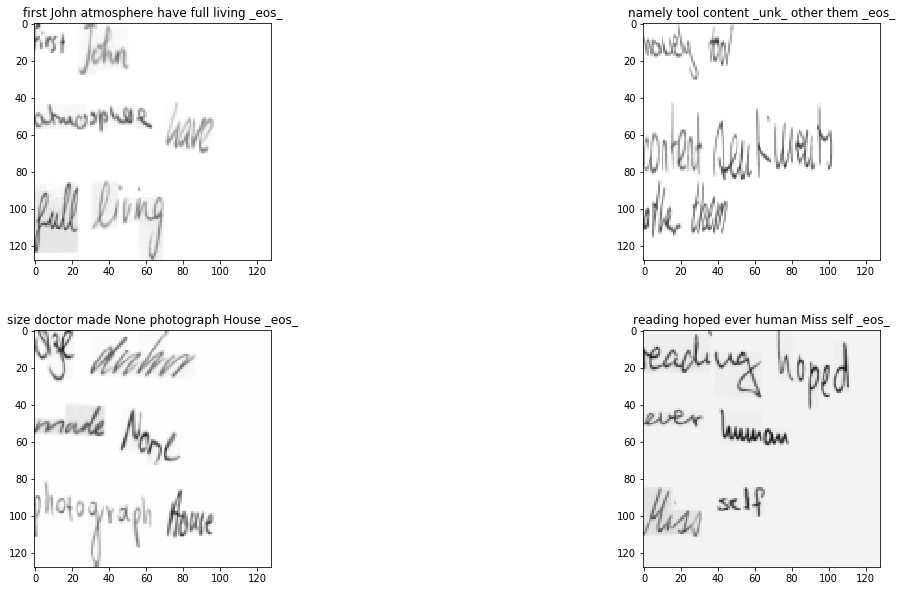

In [22]:
fig, axes = plt.subplots(2,2, gridspec_kw={'hspace': 0.3}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    t = word_label_text(y[i])
    ax=show_img(denorm(x[i])[0], ax=ax, title=t)
            
#     ticks = np.arange(16, sz, 16)
#     ax.set_yticks(ticks, minor=False)
#     ax.set_xticks(ticks, minor=False)
#     ax.yaxis.grid(True)
#     ax.xaxis.grid(True)

## Combine word/char datasets

In [21]:
class ConcatLblDataset(Dataset):
    def __init__(self, ds, y2):
        self.ds,self.y2 = ds,y2
        self.sz = ds.sz
    def __len__(self): return len(self.ds)
    
    def __getitem__(self, i):
        x,y = self.ds[i]
        return (x, (y,self.y2[i]))

In [22]:
w_data = ImageClassifierData.from_csv(PATH, FOLDER, charCSV, bs=bs, val_idxs=val_idxs, tfms=tfms, continuous=True)
w_data.aug_dl.pre_pad=False
w_data.trn_dl.pre_pad=False
w_data.val_dl.pre_pad=False

In [23]:
trn_ds = ConcatLblDataset(data.trn_ds, w_data.trn_y)
val_ds = ConcatLblDataset(data.val_ds, w_data.val_y)
data.trn_dl.dataset = trn_ds
data.val_dl.dataset = val_ds

### Verify multi dataset

In [27]:
denorm = data.trn_ds.ds.denorm   # need the extra .ds when using ConcatLblDataset
_,(y0,y1) = next(iter(data.trn_dl))

In [25]:
chars = [itos[int(w)] for w in y1[-2]]
''.join(chars)

'unfamiliar earth\narose will\nSeaweed beyond_eos__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad__pad_'

In [26]:
words = [w_itos[int(c)] for c in y0[-2]]
' '.join(words)

'unfamiliar earth arose will Seaweed beyond _eos_'

# Transformer Modules

In [24]:
# similar to batchnorm but on a layer level
class LayerNorm(nn.Module):
    def __init__(self, features, eps=1e-6):
        super(LayerNorm, self).__init__()
        self.a_2 = nn.Parameter(torch.ones(features))
        self.b_2 = nn.Parameter(torch.zeros(features))
        self.eps = eps

    def forward(self, x):
        mean = x.mean(-1, keepdim=True)
        std = x.std(-1, keepdim=True)
        return self.a_2 * (x - mean) / (std + self.eps) + self.b_2

In [25]:
class SublayerConnection(nn.Module):
    "A residual connection followed by a layer norm.  Note: (for code simplicity) norm is first."
    def __init__(self, size, dropout):
        super(SublayerConnection, self).__init__()
        self.norm = LayerNorm(size)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, sublayer):
        return x + self.dropout(sublayer(self.norm(x)))

In [26]:
def clones(module, N):
    "Produce N identical layers."
    return nn.ModuleList([copy.deepcopy(module) for _ in range(N)])

In [27]:
class Encoder(nn.Module):
    def __init__(self, layer, N):
        super(Encoder, self).__init__()
        self.layers = clones(layer, N)
        self.norm = LayerNorm(layer.size)
        
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return self.norm(x)

In [28]:
class EncoderLayer(nn.Module):
    "Encoder: self-attn and feed forward"
    def __init__(self, size, self_attn, feed_forward, dropout):
        super(EncoderLayer, self).__init__()
        self.size = size
        self.self_attn = self_attn
        self.feed_forward = feed_forward
        self.sublayer = clones(SublayerConnection(size, dropout), 2)

    def forward(self, x):
        x = self.sublayer[0](x, lambda x: self.self_attn(x, x, x))
        return self.sublayer[1](x, self.feed_forward)

In [29]:
class Decoder(nn.Module):
    "Generic N layer decoder with masking."
    def __init__(self, layer, N):
        super(Decoder, self).__init__()
        self.layers = clones(layer, N)
        self.norm = LayerNorm(layer.size)
        
    def forward(self, x, src, tgt_mask=None):
        for layer in self.layers:
            x = layer(x, src, tgt_mask)
        return self.norm(x)

In [30]:
class DecoderLayer(nn.Module):
    "Decoder: self-attn, src-attn, and feed forward"
    def __init__(self, size, self_attn, src_attn, feed_forward, dropout):
        super(DecoderLayer, self).__init__()
        self.size = size
        self.self_attn = self_attn
        self.src_attn = src_attn
        self.feed_forward = feed_forward
        self.sublayer = clones(SublayerConnection(size, dropout), 3)  # wraps layer in residual,dropout,norm
 
    def forward(self, x, src, tgt_mask=None):
        x = self.sublayer[0](x, lambda x: self.self_attn(x, x, x, tgt_mask))
        x = self.sublayer[1](x, lambda x: self.src_attn(x, src, src))
        return self.sublayer[2](x, self.feed_forward)

In [31]:
def attention(query, key, value, mask=None, dropout=None):
    "Compute 'Scaled Dot Product Attention'"
    depth = query.size(-1)
    scores = torch.matmul(query, key.transpose(-2, -1)) / math.sqrt(depth)  #(bs, sl, hw)
    if mask is not None:
        scores = scores.masked_fill(mask == 0, -1e9)    
    p_attn = F.softmax(scores, dim=-1)
    if dropout is not None:
        p_attn = dropout(p_attn)
    return torch.matmul(p_attn, value), p_attn   #(bs, sl, d_model)

In [32]:
class SingleHeadedAttention(nn.Module):
    def __init__(self, d_model, dropout=0.2):
        super(SingleHeadedAttention, self).__init__()
        self.linears = clones(nn.Linear(d_model, d_model), 4)
        self.attn = None
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, query, key, value, mask=None):        
        query, key, value = [l(x) for l, x in zip(self.linears, (query, key, value))]
        x, self.attn = attention(query, key, value, mask=mask, dropout=self.dropout)
        return self.linears[-1](x)

In [33]:
class MultiHeadedAttention(nn.Module):
    def __init__(self, d_model, h=1, dropout=0.2):
        super(MultiHeadedAttention, self).__init__()
        assert d_model % h == 0
        self.d_k = d_model // h        # assume d_v always equals d_k
        self.h = h
        self.linears = clones(nn.Linear(d_model, d_model), 4)
        self.attn = None
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, q, k, v, mask=None):
        if mask is not None: mask = mask.unsqueeze(1)
        bs = q.size(0)
        
        # 1) Do all the linear projections in batch from d_model => h x d_k 
        q, k, v = [l(x).view(bs, -1, self.h, self.d_k).transpose(1,2) for l, x in zip(self.linears, (q, k, v))]
        
        # 2) Apply attention on all the projected vectors in batch. 
        x, self.attn = attention(q, k, v, mask=mask, dropout=self.dropout)
        
        # 3) "Concat" using a view and apply a final linear. 
        x = x.transpose(1, 2).contiguous().view(bs, -1, self.h * self.d_k)
        return self.linears[-1](x)

In [34]:
class PositionwiseFeedForward(nn.Module):
    def __init__(self, d_model, dropout=0.2):
        super(PositionwiseFeedForward, self).__init__()
        self.w_1 = nn.Linear(d_model, d_model*4)
        self.w_2 = nn.Linear(d_model*4, d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        return self.w_2(self.dropout(F.relu(self.w_1(x))))

In [35]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=2000):
        super(PositionalEncoding, self).__init__()
        
        self.dropout = nn.Dropout(p=dropout)
        
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0.0, max_len).unsqueeze(1)
        log_increment = math.log(1e4) / d_model
        div_term = torch.exp(torch.arange(0.0, d_model, 2) * -log_increment)  
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe.unsqueeze_(0)

        self.register_buffer('pe', pe)    #(1,max_len,d_model)
        
    def forward(self, x):
        x = x + Variable(self.pe[:, :x.size(1)], requires_grad=False)
        return self.dropout(x)

In [36]:
class ResnetBase(nn.Module):
    def __init__(self, em_sz):
        super().__init__()
        
        slices = {128: -4, 256: -3, 512: -2}
        s = slices[em_sz]
        
        net = f(True)
        modules = list(net.children())[:s]
        self.base = nn.Sequential(*modules)
        
    def forward(self, x):
        return self.base(x)

# Full Arch

In [39]:
class EncoderDecoder(nn.Module):
    def __init__(self, encoder, decoder, tgt_embed, generator):
        super(EncoderDecoder, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.tgt_embed = tgt_embed
        self.generator = generator
        
    def forward(self, src, tgt, tgt_mask=None):
        return self.decode(self.encode(src), tgt, tgt_mask)
    
    def encode(self, src):
        return self.encoder(src)
    
    def decode(self, src, tgt, tgt_mask=None):
        return self.decoder(self.tgt_embed(tgt), src, tgt_mask)
    
    def generate(self, outs):
        return self.generator(outs)

In [40]:
class ResnetBase(nn.Module):
    def __init__(self, em_sz, d_model):
        super().__init__()
        
        slices = {128: -4, 256: -3, 512: -2}
        s = slices[em_sz]
        
        net = f(True)
        modules = list(net.children())[:s]
        self.base = nn.Sequential(*modules)
        self.linear = nn.Linear(em_sz, d_model)
        
    def forward(self, x):
        x = self.base(x).flatten(2,3).permute(0,2,1)
        x = self.linear(x) * math.sqrt(self.linear.out_features)
        return x

In [41]:
class Embeddings(nn.Module):
    def __init__(self, d_model, vocab):
        super(Embeddings, self).__init__()
        self.lut = nn.Embedding(vocab, d_model)
        self.d_model = d_model

    def forward(self, x):
        return self.lut(x) * math.sqrt(self.d_model)

In [42]:
def make_full_model(vocab, d_model=512, N=4, drops=0.2):
    c = copy.deepcopy
    attn = SingleHeadedAttention(d_model)
    ff = PositionwiseFeedForward(d_model, drops)

    model = EncoderDecoder(
        Encoder(EncoderLayer(d_model, c(attn), c(ff), drops), N),
        Decoder(DecoderLayer(d_model, c(attn), c(attn), c(ff), drops), N),
        nn.Sequential(
            Embeddings(d_model, vocab), PositionalEncoding(d_model, drops, 5000)
        ),
        nn.Linear(d_model, vocab)
    )
        
    for p in model.parameters():
        if p.dim() > 1:
            nn.init.xavier_uniform_(p)
                    
    return model

In [43]:
class Img2Seq(nn.Module):
    def __init__(self, img_encoder, transformer):
        super(Img2Seq, self).__init__()
        self.img_enc = img_encoder
        self.transformer = transformer
        
    def forward(self, src, tgt=None, tgt_mask=None):
        feats = self.img_enc(src)                            # ([bs, h*w, d_model])
        dec_outs = self.transformer(feats, tgt, tgt_mask)    # ([bs, sl, d_model])
        out = self.transformer.generate(dec_outs)       # ([bs, sl, vocab])
#         lm_out = self.lm(tgt, tgt_mask)
#         out = out * lm_out
        return out #* lm_out

    def greedy_decode(self, src, seq_len):
        with torch.no_grad():
            feats = self.transformer.encode(self.img_enc(src))
            bs = src.size(0)
            tgt = torch.ones((bs,1), dtype=torch.long, device=device)

            res = []
            for i in tqdm(range(seq_len)):
                mask = subsequent_mask(tgt.size(-1))
                dec_outs = self.transformer.decode(feats, Variable(tgt), Variable(mask))
                prob = self.transformer.generate(dec_outs[:,-1])
                res.append(prob)
                pred = torch.argmax(prob, dim=-1, keepdim=True)
                if (pred==0).all(): break
                tgt = torch.cat([tgt,pred], dim=-1)
            out = torch.stack(res).transpose(1,0).contiguous()
            return out      

In [44]:
d_model = 512
em_sz = 256
img_encoder = ResnetBase(em_sz, d_model)
transformer = make_full_model(len(itos), d_model)
net = Img2Seq(img_encoder, transformer)

opt_fn = partial(optim.Adam, betas=(0.7, 0.99)) #, lr=0, betas=(0.9, 0.98), eps=1e-9)
# partial: way to always call a function with a given set of arguments or keywords

learn = RNN_Learner(data, BasicModel(to_gpu(net)), opt_fn=opt_fn)
learn.clip = 0.25
learn.crit = LabelSmoothing(smoothing=0.1)   #XE_loss
learn.metrics = [cer]

# Word Arch

In [36]:
class MulConstant(nn.Module):
    def __init__(self, const):
        super(MulConstant, self).__init__()
        self.const = const

    def forward(self, x):
        return x * self.const

In [37]:
class ImageAdaptor(nn.Module):
    def __init__(self, em_sz, d_model, drop=0.1):
        super().__init__()
        
        self.d_model = d_model
        self.linear = nn.Linear(em_sz, d_model)
        self.dropout = nn.Dropout(drop)
        
    def forward(self, x):        
        x = x.flatten(2,3).permute(0,2,1)
        x = self.linear(x) * 4   #adjust the std to ~1
        return self.dropout(x)

In [38]:
class EncoderDecoder(nn.Module):
    def __init__(self, encoder, decoder, src_embed, tgt_embed, generator):
        super(EncoderDecoder, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.src_embed = src_embed
        self.tgt_embed = tgt_embed
        self.generator = generator
        
    def forward(self, src, tgt, tgt_mask=None):
        return self.decode(self.encode(src), tgt, tgt_mask)
    
    def encode(self, src):
        return self.encoder(self.src_embed(src))
    
    def decode(self, src, tgt, tgt_mask=None):
        return self.decoder(self.tgt_embed(tgt), src, tgt_mask)
    
    def generate(self, outs):
        return self.generator(outs)

In [39]:
def make_full_model(em_sz, vocab, d_model=512, N=4, drops=0.2):
    c = copy.deepcopy
    attn = SingleHeadedAttention(d_model)
    ff = PositionwiseFeedForward(d_model, drops)

    model = EncoderDecoder(
        Encoder(EncoderLayer(d_model, c(attn), c(ff), drops), N),
        Decoder(DecoderLayer(d_model, c(attn), c(attn), c(ff), drops), N),
        ImageAdaptor(em_sz, d_model),
        nn.Sequential(
            nn.Embedding(vocab, d_model), MulConstant(60), PositionalEncoding(d_model, drops, 2000)
        ),
        nn.Linear(d_model, vocab)
    )
        
    for p in model.parameters():
        if p.dim() > 1:
            nn.init.xavier_uniform_(p)
                    
    return model

In [40]:
class Img2Seq(nn.Module):
    def __init__(self, img_encoder, transformer):
        super(Img2Seq, self).__init__()
        self.img_enc = img_encoder
        self.transformer = transformer
        
    def forward(self, src, tgt=None, tgt_mask=None):
        feats = self.img_enc(src)                            # ([bs, h*w, d_model])
        dec_outs = self.transformer(feats, tgt, tgt_mask)    # ([bs, sl, d_model])
        out = self.transformer.generate(dec_outs)       # ([bs, sl, vocab])
        return out

    def greedy_decode(self, src, seq_len):
        with torch.no_grad():
            feats = self.transformer.encode(self.img_enc(src))
            bs = src.size(0)
            tgt = torch.ones((bs,1), dtype=torch.long, device=device)

            res = []
            for i in tqdm(range(seq_len)):
                mask = subsequent_mask(tgt.size(-1))
                dec_outs = self.transformer.decode(feats, Variable(tgt), Variable(mask))
                prob = self.transformer.generate(dec_outs[:,-1])
                res.append(prob)
                pred = torch.argmax(prob, dim=-1, keepdim=True)
                if (pred==0).all(): break
                tgt = torch.cat([tgt,pred], dim=-1)
            out = torch.stack(res).transpose(1,0).contiguous()
            return out      

In [76]:
d_model = 512
em_sz = 512
img_encoder = ResnetBase(em_sz)
transformer = make_full_model(em_sz, len(w_itos), d_model)
net = Img2Seq(img_encoder, transformer)

opt_fn = partial(optim.Adam, betas=(0.7, 0.99)) #, lr=0, betas=(0.9, 0.98), eps=1e-9)
# partial: way to always call a function with a given set of arguments or keywords

learn = RNN_Learner(data, BasicModel(to_gpu(net)), opt_fn=opt_fn)
learn.clip = 0.25
learn.crit = LabelSmoothing(smoothing=0.1)
learn.metrics = [wer]
learn.stepper = TfmrStepper

# WordChar Arch

In [37]:
class Embeddings(nn.Module):
    def __init__(self, d_model, vocab):
        super(Embeddings, self).__init__()
        self.lut = nn.Embedding(vocab, d_model)
        self.d_model = d_model

    def forward(self, x):
        return self.lut(x) * math.sqrt(self.d_model)

In [38]:
class ImageAdaptor(nn.Module):
    def __init__(self, em_sz, d_model, drop=0.1):
        super().__init__()
        
        self.d_model = d_model
        self.linear = nn.Linear(em_sz, d_model)
        self.dropout = nn.Dropout(drop)
        
    def forward(self, x):        
        x = x.flatten(2,3).permute(0,2,1)
        x = self.linear(x) * 4   #adjust the std to ~1
        return self.dropout(x)

In [39]:
class WordCharTransformer(nn.Module):
    def __init__(self, encoder, w_dec, w_dec2, c_dec, c_dec2, src_embed, w_emb, c_emb, w_gen, c_gen):
        super(WordCharTransformer, self).__init__()
        self.encoder = encoder
        self.w_decoder = w_dec
        self.c_decoder = c_dec
        self.w_decoder2 = w_dec2
        self.c_decoder2 = c_dec2
        self.src_embed = src_embed
        self.w_embed = w_emb
        self.c_embed = c_emb
        self.w_generator = w_gen
        self.c_generator = c_gen
    
    def forward(self, src, w_tgt, c_tgt, w_mask, c_mask):
        feats = self.encode(src)

        #char/word in parallel
        c_emb = self.c_embed(c_tgt)
        w_emb = self.w_embed(w_tgt)
        c_out1 = self.c_decoder(c_emb, feats, c_mask)
        w_out1 = self.w_decoder(w_emb, feats, w_mask)
        c_out2 = self.c_decoder2(c_emb, w_out1, c_mask)
        w_out2 = self.w_decoder2(w_emb, c_out1, w_mask)
        w_out, c_out = w_out1+w_out2, c_out1+c_out2
        
#         # char into word
#         c_out = self.c_decoder(self.c_embed(c_tgt), feats, c_mask)
#         w_out = self.w_decoder(self.w_embed(w_tgt), c_out, w_mask)
#         # word into char
#         w_out = self.w_decoder(self.w_embed(w_tgt), feats, w_mask)
#         c_out = self.c_decoder(self.c_embed(c_tgt), w_out, c_mask)

        return w_out, c_out
    
    def encode(self, src):
        return self.encoder(self.src_embed(src))
    
    def generate(self, w_outs, c_outs):
        return self.w_generator(w_outs), self.c_generator(c_outs)

In [40]:
def make_full_model(w_vocab, c_vocab, em_sz=256, d_model=512, N=4, drop=0.2):
    c = copy.deepcopy
    attn = SingleHeadedAttention(d_model)
#     attn = MultiHeadedAttention(d_model, 8)
    ff = PositionwiseFeedForward(d_model, drop)

    model = WordCharTransformer(
        Encoder(EncoderLayer(d_model, c(attn), c(ff), drop), N),
        Decoder(DecoderLayer(d_model, c(attn), c(attn), c(ff), drop), N),
        Decoder(DecoderLayer(d_model, c(attn), c(attn), c(ff), drop), N),
        Decoder(DecoderLayer(d_model, c(attn), c(attn), c(ff), drop), N),
        Decoder(DecoderLayer(d_model, c(attn), c(attn), c(ff), drop), N),
        ImageAdaptor(em_sz, d_model),
        nn.Sequential(
            Embeddings(d_model, w_vocab), PositionalEncoding(d_model, drop, 2000)
        ),
        nn.Sequential(
            Embeddings(d_model, c_vocab), PositionalEncoding(d_model, drop, 2000)
        ),
        nn.Linear(d_model, w_vocab),
        nn.Linear(d_model, c_vocab)
    )
        
    for p in model.parameters():
        if p.dim() > 1:
            nn.init.xavier_uniform_(p)
                    
    return model

In [41]:
class Img2Seq(nn.Module):
    def __init__(self, img_encoder, transformer):
        super(Img2Seq, self).__init__()
        self.img_enc = img_encoder
        self.transformer = transformer
        
    def forward(self, src, w_tgt, c_tgt, w_mask, c_mask):
        res = self.transformer(self.img_enc(src), w_tgt, c_tgt, w_mask, c_mask)
        return self.transformer.generate(*res)      #=> (w_out, c_out)

In [54]:
def greedy_decode(model, src, word_len, char_len):
    tfmr = model.transformer
    
    with torch.no_grad():
        feats = model.transformer.encode(model.img_enc(src))
        bs = src.size(0)
        
        # char/word => word/char
        c_dec1,_ = g_decode(tfmr.c_embed, tfmr.c_decoder, tfmr.c_generator, feats, char_len)
        w_dec1,_ = g_decode(tfmr.w_embed, tfmr.w_decoder, tfmr.w_generator, feats, word_len)
        c_dec2,_ = g_decode(tfmr.c_embed, tfmr.c_decoder, tfmr.c_generator, w_dec1, char_len)
        w_dec2,_ = g_decode(tfmr.w_embed, tfmr.w_decoder, tfmr.w_generator, c_dec1, word_len)
        w_out = tfmr.w_generator(w_dec1+w_dec2)
        c_out = tfmr.c_generator(c_dec1+c_dec2)

#         # words=>chars
#         w_dec,w_out = g_decode(tfmr.w_embed, tfmr.w_decoder, tfmr.w_generator, feats, word_len)
#         _,c_out = g_decode(tfmr.c_embed, tfmr.c_decoder, tfmr.c_generator, w_dec, char_len)
        
#         # chars=>words
#         c_dec,c_out = g_decode(tfmr.c_embed, tfmr.c_decoder, tfmr.c_generator, feats, char_len)
#         _,w_out = g_decode(tfmr.w_embed, tfmr.w_decoder, tfmr.w_generator, c_dec, word_len)

        return w_out, c_out    


def g_decode(embed, decoder, generator, src, seq_len):
    tgt = torch.ones((bs,1), dtype=torch.long, device=device)
    out = None
    res = []
    for i in tqdm(range(seq_len)):
        mask = Variable(subsequent_mask(tgt.size(-1)))
        emb = embed(Variable(tgt))
        out = decoder(emb, src, mask)
        prob = generator(out[:,-1])
        res.append(prob)
        pred = torch.argmax(prob, dim=-1, keepdim=True)
        #if (pred==0).all(): break
        tgt = torch.cat([tgt,pred], dim=-1)
    res = torch.stack(res).transpose(1,0).contiguous()
    return out,res

In [43]:
d_model = 512
em_sz = 256

img_encoder = ResnetBase(em_sz)
transformer = make_full_model(len(w_itos), len(itos), em_sz, d_model)
net = Img2Seq(img_encoder, transformer)

opt_fn = partial(optim.Adam, betas=(0.7, 0.99)) #, lr=0, betas=(0.9, 0.98), eps=1e-9)
# partial: way to always call a function with a given set of arguments or keywords

learn = RNN_Learner(data, BasicModel(to_gpu(net)), opt_fn=opt_fn)
learn.clip = 0.25
learn.crit = custom_loss  #LabelSmoothing(smoothing=0.1)   #XE_loss
learn.metrics = [wer, cer]
learn.stepper = WordCharStepper

# Train

### load state dict for changes

In [81]:
#LM
LM_PATH = Path('data/wikitext/wikitext-2-raw')
sd = torch.load(LM_PATH/'models'/'LM.h5', map_location=lambda storage, loc: storage)

In [ ]:
sd = torch.load(PATH/'models'/'tfmr_paragraph.h5', map_location=lambda storage, loc: storage)
sd.pop('img_enc.linear.bias')   # need to remove mismatched linear weight

In [82]:
learn.model.load_state_dict(sd, strict=False)

### load model

In [45]:
learn.load('tfmr_mix_words_512')

## LR find

 74%|███████▍  | 314/425 [02:16<00:48,  2.29it/s, loss=150] 

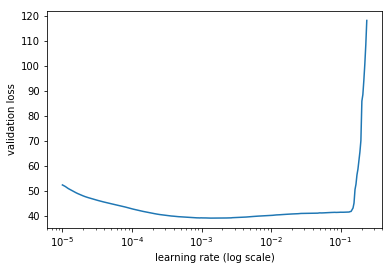

In [51]:
learn.lr_find(stepper=TfmrStepper)
learn.sched.plot(n_skip=0, n_skip_end=2)

## Experimentation

In [45]:
#gpu
lr=1e-4
learn.fit(lr, 5, cycle_len=1, stepper=learn.stepper, use_clr=(20,5))
# 3x2 dataset

# word=>char -- sz: 128, bs: 80
# 105.345383 100.482146 0.693946   0.579319    no embed scaling, no loss scaling, 4 layers   'tmp1'
# 221.378111 217.133886 0.708194   0.623945    word_loss*5
# 69.953589  61.338107  0.743351   0.189088    word_emb*60/char_emb*18
# 47.196178  43.958055  0.684498   0.095614    2nd run     'tmp2'

# char=>word -- sz: 128, bs: 100
# 77.632515  68.734497  0.594495   0.362575    word_emb*60/char_emb*18
# 46.073947  39.174255  0.264533   0.22869     2nd run

# 77.141979  67.939421  0.586038   0.35784     embeds*sqrt(d_model)
# 44.896454  38.501496  0.256305   0.225035    'tmp5'
# valid:     36.0623   0.26857   0.21251
# greedy:    217.616   0.65714   0.29993

# char/word parallel -- sz: 128, bs: 100
# 84.565249  76.067216  0.681638   0.40317     word_emb*60/char_emb*18
# 79.528199  71.351029  0.6596     0.37568     embeds*sqrt(d_model)         'tmp6'

# char/word => word/char -- sz: 128, bs: 100
# 56.689144  45.048114  0.409067   0.214524     embeds*sqrt(d_model)    
# 30.025065  23.994327  0.16859    0.105596     2nd run     'tmp7'
# 55.111607  44.468761  0.510914   0.164889     add outs before generator
# 26.255133  21.849148  0.206343   0.077782     2nd run     'tmp8'

# char only -- sz: 128, bs: 100
# 58.966977  50.523393  0.416515    standard  char_emb*18
# 51.947285  44.627351  0.359907    "" w/ RandomLighting(.05, .05) transform     'char_tmp3'
# valid:     42.7769   0.33855
# greedy:    184.729   0.45757

# word only -- sz: 128, bs: 100
# 33.331867  33.020701  0.742629    standard  (word_emb*60)
# 35.063245  34.731164  0.745257    "", em_sz: 128
# 33.107949  32.847421  0.739657    standard w/ RandomLighting(.05, .05) transform    'word_tmp4'
# 33.354061  33.027002  0.742305    "", em_sz: 512

# word only -- sz: 256, bs: 60
# 36.973129  37.450787  0.759086    standard

epoch      trn_loss   val_loss   wer        cer             
    0      45.968441  37.124876  0.423905   0.132889  
    1      38.967435  31.666157  0.3488     0.111064        
    2      33.738323  27.590907  0.292629   0.096398        
    3      29.690914  24.368256  0.244971   0.086217        
    4      26.255133  21.849148  0.206343   0.077782        



[21.849148076375325, 0.20634285714285708, 0.07778189707283589]

In [46]:
learn.save('tmp8')

## Freezing

In [51]:
learn.freeze_to(1)

In [55]:
lr=1e-4
learn.fit(lr, 3, cycle_len=1, stepper=TfmrStepper, use_clr=(20,5))

epoch      trn_loss   val_loss   cer        acc             
    0      53.612339  51.179181  0.755195   0.480144  
    1      47.651171  45.845306  0.698491   0.525802        
    2      43.597182  41.431472  0.650144   0.563912        


[41.43147211710612, 0.6501441172937663, 0.5639118679364522]

In [56]:
learn.unfreeze()
lr = np.array([lr/10, lr])

## Initial size

In [44]:
lr=1e-4
learn.fit(lr, 5, cycle_len=1, stepper=TfmrStepper, use_clr=(20,8), best_save_name=f'best_{FOLDER}_{sz}')
# 3x1, sz: 128, bs: 100
# 20.347157  17.23408   0.228328
# 10.732795  9.875141   0.12633     2nd run

# 6.753466   6.750452   0.085309    Full Transformer (4N/4h), 10cycles(20,10)   ~33m   'tfmr_full_3x1'
# 7.0736     6.798651   0.085855    "", single attn, 10cycles(20,10)            ~38m

# 7.161385   8.286392   0.102471   0.92869    exp_3x1

# 3x2; sz: 128, bs: 100
# 65.659014  59.8375    0.492443   Transformer (4N/8h), 5cycles(20,8)    'tfmr_8head_128'
# 3x2; sz: 256, bs: 60
# 16.186042  14.892255  0.101064   Transformer (4N/8h), 5cycles(20,8)    'tfmr_8head_256'


# 3x2; sz: 256, bs: 60
# 14.65408   13.10881   0.090017    preload tfmr_3x1_256
# 4.464029   5.072127   0.037011    Full Transformer (4N/0h), 10cycles(20,10)   ~1h 46m

# 6.853619   7.136484   0.050812   0.962716    exp_3x2

# Mixed Synth, sz: 128, bs: 100
# 15.684915  14.209854  0.133399    enc/dec/mixer, N:4, pre-loaded LM  ~1h

# lg; sz: 256, bs: 60
# 161.081839 137.861294 0.231951    enc/dec/mixer, N:4, pre-loaded LM  ~1h 45m

# lg; sz: 400, bs: 30
# 98.491235  89.396089  0.123849    preload tfmr_3x2      'tfmr_lg'
# 101.903571 88.239827  0.122516    -same as above-       'tfmr_lg2'
# bs: 45
# 161.90945  169.713365 0.207615    dropout:0.5    'tfmr_lg_tmp'
# 29.706235  25.84234   0.039261    Full Transformer (4N/0h), 10cycles(20,10)   ~3h 47m

# concat lines, sz: 512, bs: 20
# LMmixer
# 68.669186  56.487096  0.123718    345, preload 'tfmr_lg_LM_mixer'
# 144.601336 116.728641 0.153257    678, preload 345
#      9-12, preload 678, lr: 1e-5

# Full
# 26.620874  24.083611  0.05163     345, preload 'tfmr_full_lg'  ~2hr  'tfmr_cat345_full'
# 46.148448  37.998259  0.04748     678, preload 345   ~2h 25m  'tfmr_cat678_full'
# 56.235635  42.104473  0.03309     9-12, preload 678   ~3h 25m   'tfmr_cat9-12_full'

# paragraph; sz:512, bs:30
# 289.464371 202.553455 0.175994     preload tfmr_lg2, 4 cycles
# 178.432805 145.702918 0.128241     2nd run, 5 cycles
# 144.489454 130.875442 0.116076     3rd run              'tfmr_paragraph'
# bs: 20
# 66.923881  70.373825  0.069164     Full Transformer (4N/0h), 10cycles(20,10)     'tfmr_full_paragraph'
# 81.810724  78.974658  0.078329     "", reversed src_attn/self_attn

# 9-12; sz: 512, bs: 30
# 139.165167 102.821483 0.089816     preload 'tfmr_full_paragraph'      '9-12_512'

# paragraph; sz: 800, bs: 8
# 24.8       45.8       0.0407       preload tfmr_cat9-12_full_800, 3cycles    'tfmr_pg_full_800'

# concat lines + pg, sz: 800, bs: 8
# 9.978522   9.815259   0.006313     preload tfmr_cat9-12_full_800, 1cycle     'tfmr_catpg_800'


# mix_words (new dataset); sz: 400, bs: 30
# 60.475961  48.045776  0.059005     Tfmr (4N/0h); preload 'tfmr_full_lg' (512)     'tfmr_mix_words_400'

# mix_words (new dataset); sz: 400, bs: 10 
# 83.258275  66.635521  0.08263      Transformer (4N/8h), 5cycles(20,8)
# 42.608748  38.862213  0.047246     2nd run                                 'tfmr_8head_400_mix'

epoch      trn_loss   val_loss   cer        acc               
    0      73.163053  58.140887  0.071662   0.949707  
    1      60.50155   51.939754  0.063609   0.955472          
    2      59.753481  46.487042  0.056947   0.960387          
    3      52.389365  42.310483  0.0514     0.964396          
    4      42.608748  38.862213  0.047246   0.96756           



[38.86221293245085, 0.0472458828242819, 0.9675595987940309]

In [45]:
learn.save('tfmr_8head_400_mix')

## Increase size

In [105]:
# sz,bs = 512,20
# sz,bs = 1024,5
sz,bs = 256,60
# sz,bs = 400,45

In [112]:
learn.set_data(data)

In [113]:
lr=1e-4
learn.fit(lr, 5, cycle_len=1, stepper=TfmrStepper, use_clr=(20,5) )#, best_save_name=f'best_{FOLDER}_{sz}')
# 3x2

# word=>char -- sz: 256, bs: 60
# 33.879118  32.627168  0.564781   0.06385  word_emb*60/char_emb*18   'word_char_3x2_256'
# valid:     31.2267   0.57380   0.06032
# greedy:    223.391   0.57857   0.41339


epoch      trn_loss   val_loss   wer        cer              
    0      43.971688  41.220263  0.656819   0.087815  
    1      40.604727  38.390507  0.625086   0.080967         
    2      37.654533  36.13218   0.604629   0.075007         
    3      35.510825  34.295805  0.584      0.069355         
    4      33.879118  32.627168  0.564781   0.06385          


[32.62716844177246, 0.5647809523809526, 0.06385043637873898]

In [131]:
learn.save('word_char_3x2_256')

# Test

In [45]:
from scipy.ndimage import gaussian_filter
k=16

def torch_scale_attns(attns):
    bs,sl,hw = attns.shape
    num = int(math.sqrt(hw))   # sz // k
    mod = attns.view(bs,sl,num,num)
    scaled = F.interpolate(mod, size=sz)
    return scaled  #([bs, sl, h, w])

def g_filter(att):
    return gaussian_filter(att, sigma=k)

In [46]:
# def self_attn(layer=-1): return learn.model.transformer.decoder.layers[layer].self_attn.attn.data.cpu()
def word_source_attn(layer=-1): return learn.model.transformer.w_decoder.layers[layer].src_attn.attn.data.cpu()
def char_source_attn(layer=-1): return learn.model.transformer.c_decoder.layers[layer].src_attn.attn.data.cpu()

In [47]:
learn.load('tmp7')
# tfmr_full_lg, tfmr_full_paragraph, tfmr_mix_words_512, tfmr_8head_512_mix

In [48]:
v_dl = iter(data.val_dl)
denorm = data.val_ds.ds.denorm

## Uploaded Images

In [48]:
x,y = next(v_dl)

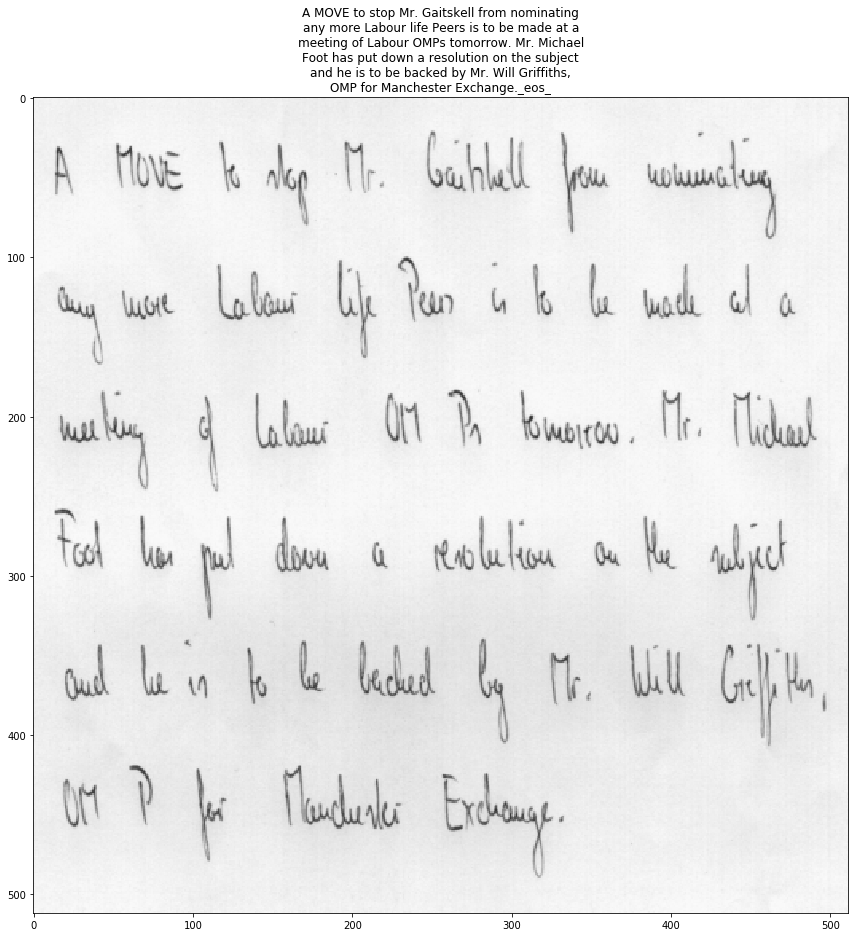

In [49]:
p = char_label_text(y[0])
show_img(data.val_ds.denorm(x[0])[0], figsize=(15,15), title=p)

In [77]:
def thresh_edit(fname, thresh=100, bg=245):
    im = Image.open(fname).convert('L')  #grayscale
    np_im = np.array(im)
    im.close()
    thresh_mask = np_im > thresh
    np_im[thresh_mask] = bg
    return Image.fromarray(np_im, 'L')

In [ ]:
im = thresh_edit(PATH/'test3.png')
show_img(im, figsize=(15,15))

In [75]:
e = 'edit_'+str(fname.name)
edited_fname = PATH/e

In [126]:
edited_im.save(edited_fname)

In [97]:
edited_fname = PATH/'edit_test4.png'
image = Variable(torch.Tensor(tfms[0](open_image(edited_fname))[None]))

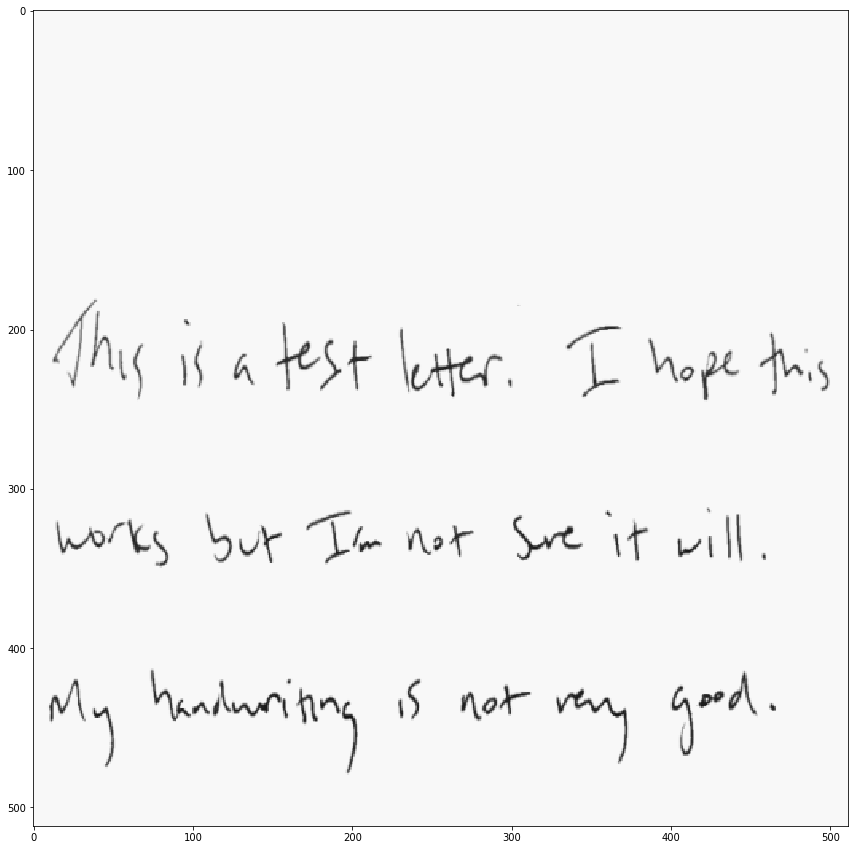

In [98]:
show_img(denorm(image[0])[0], figsize=(15,15))

In [99]:
seq_len=200

learn.model.eval()
g_preds = learn.model.greedy_decode(image, seq_len)
g_res = torch.argmax(g_preds, dim=-1)

 46%|████▋     | 93/200 [00:05<00:08, 13.29it/s]

In [100]:
g_attn = source_attn()

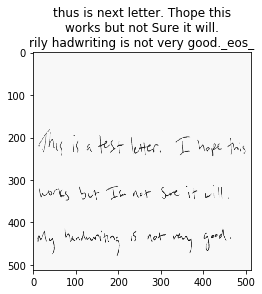

In [101]:
p = char_label_text(g_res)
show_img(data.val_ds.denorm(image)[0], title=p)

In [102]:
# r = torch.tensor([g_res], dtype=torch.long, device=device)
p = char_label_text(g_res)

truth = "This is a test letter. I hope this\nworks but I'm not sure it will.\nMy handwriting is not very good._eos_"
_cer(truth,p)

0.16279069767441862

In [73]:
imgs = [denorm(image)[0]]

In [ ]:
probs, idxs = torch.topk(F.softmax(g_preds[0], dim=-1), 3, dim=-1)
res=[]
for i,p in zip(idxs,probs):
    row = {}
    for k,v in zip(i,p):
        row[itos[k]] = round(v.item(), 3)
    res.append(row)

In [110]:
res

[{'S': 0.405, 'A': 0.369, 'J': 0.04},
 {'h': 0.688, 't': 0.244, 'i': 0.009},
 {'u': 0.871, 'e': 0.054, 'r': 0.003},
 {'s': 0.899, 'e': 0.039, 'r': 0.01},
 {' ': 0.887, ',': 0.023, ';': 0.004},
 {'i': 0.927, 'a': 0.004, 's': 0.004},
 {'s': 0.965, 'n': 0.008, ',': 0.001},
 {' ': 0.933, ',': 0.003, 'n': 0.003},
 {'a': 0.865, 'n': 0.025, 'u': 0.022},
 {' ': 0.922, 'n': 0.02, 't': 0.007},
 {'t': 0.916, 'f': 0.004, '1': 0.002},
 {'e': 0.938, 'a': 0.003, 's': 0.001},
 {'s': 0.913, 'x': 0.011, 'f': 0.005},
 {'t': 0.933, 'e': 0.001, ':': 0.001},
 {' ': 0.925, 'e': 0.001, 'a': 0.001},
 {'l': 0.931, 't': 0.003, '_eos_': 0.001},
 {'e': 0.926, 'o': 0.007, 'a': 0.005},
 {'t': 0.951, 'x': 0.002, 'a': 0.002},
 {'t': 0.937, 'e': 0.011, 'a': 0.002},
 {'e': 0.934, 'l': 0.001, 'f': 0.001},
 {'r': 0.933, 'd': 0.001, '-': 0.001},
 {'.': 0.948, ' ': 0.012, ':': 0.007},
 {' ': 0.933, '.': 0.001, 'F': 0.001},
 {'F': 0.472, 'I': 0.383, 'E': 0.035},
 {' ': 0.881, 'r': 0.012, 'o': 0.012},
 {'h': 0.932, 'R': 0.001

## Results

### Word + Char

In [55]:
x,y = next(v_dl)
imgs = denorm(x)

learn.model.eval()

shifted_word = rshift(y[0]).long()
shifted_char = rshift(y[1]).long()
word_mask = subsequent_mask(shifted_word.size(-1)) #make_tgt_mask(shifted_y)
char_mask = subsequent_mask(shifted_char.size(-1))

v_preds = learn.model(x, shifted_word, shifted_char, word_mask, char_mask)
v_w_res = torch.argmax(v_preds[0], dim=-1)
v_c_res = torch.argmax(v_preds[1], dim=-1)

v_w_attn = word_source_attn()
v_c_attn = char_source_attn()

g_preds = greedy_decode(learn.model, x, word_len, char_len)
g_w_res = torch.argmax(g_preds[0], dim=-1)
g_c_res = torch.argmax(g_preds[1], dim=-1)

g_w_attn = word_source_attn()
g_c_attn = char_source_attn()

100%|██████████| 8/8 [00:02<00:00,  3.37it/s]


In [56]:
v = [learn.crit(v_preds, y).item(), wer(v_preds, y), cer(v_preds, y)]
print(f'valid:     {str(v[0])[:7]}   {str(v[1])[:7]}   {str(v[2])[:7]}')

g = [learn.crit(g_preds, y).item(), wer(g_preds, y), cer(g_preds, y)]
print(f'greedy:    {str(g[0])[:7]}   {str(g[1])[:7]}   {str(g[2])[:7]}')

valid:     415.987   0.84714   0.80174
greedy:    395.471   1.13142   1.64426


### Single

In [54]:
x,y = next(v_dl)
imgs = denorm(x)

learn.model.eval()

shifted_y = rshift(y).long()
mask = subsequent_mask(shifted_y.size(-1)) #make_tgt_mask(shifted_y)

v_preds = learn.model(x, shifted_y, mask)
v_res = torch.argmax(v_preds, dim=-1)
# v_attn = source_attn()

g_preds = learn.model.greedy_decode(x, char_len)
g_res = torch.argmax(g_preds, dim=-1)
# g_attn = source_attn()

 71%|███████   | 53/75 [00:02<00:01, 21.73it/s]


In [57]:
v = [learn.crit(v_preds, y).item(), cer(v_preds, y)]
print(f'valid:     {str(v[0])[:7]}   {str(v[1])[:7]}')

g = [learn.crit(g_preds, y).item(), cer(g_preds, y)]
print(f'greedy:    {str(g[0])[:7]}   {str(g[1])[:7]}')

valid:     42.7769   0.33855
greedy:    184.729   0.45757


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


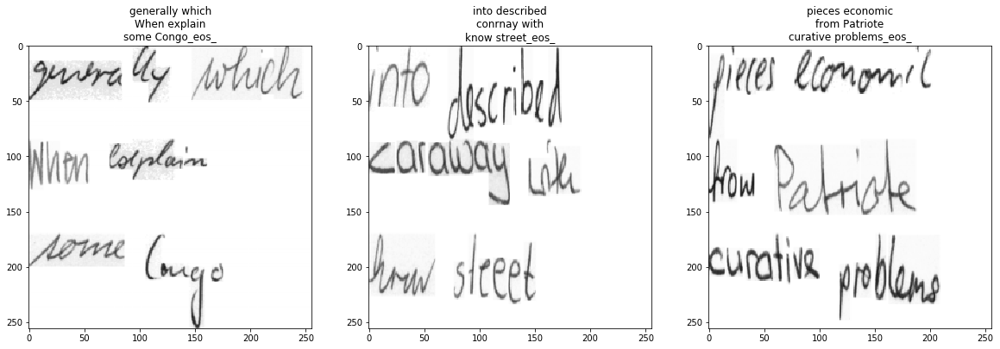

In [135]:
#valid
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(v_chars[i])
    ax=show_img(imgs[i], ax=ax, title=p)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


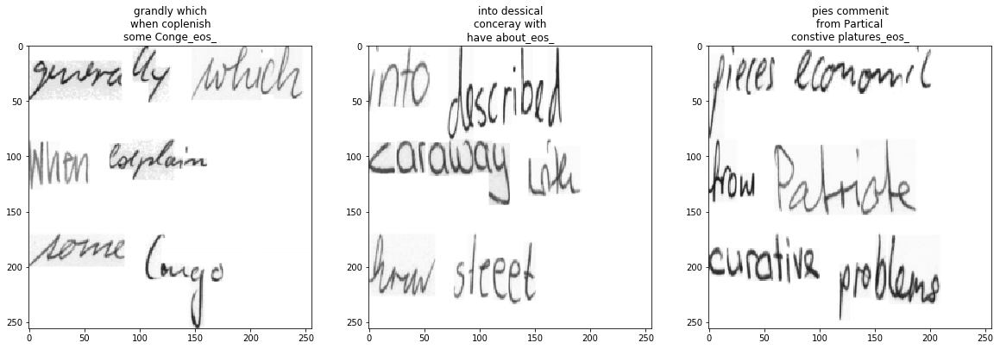

In [136]:
#greedy
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(g_chars[i])
    ax=show_img(imgs[i], ax=ax, title=p)

In [ ]:
# tfmr full
#             loss       cer       acc
# valid:     2.42856   0.02981   0.98177   3x1, 256/60, 'tfmr_full_3x1_single_attn'
# greedy:    11.9438   0.02745   0.93385

# valid:     1.98831   0.01858   0.98505   3x1, 256/60, 'exp_3x1_256'
# greedy:    16.3832   0.02167   0.90944

# valid:     1.47604   0.00797   0.99523   3x2, 400/45,  'tfmr_full_3x2'
# greedy:    21.4682   0.01097   0.93762

# valid:     7.30494   0.01206   0.99086   lg,  512/30,  'tfmr_full_lg'
# greedy:    434.610   0.02398   0.69553

# valid:     25.4131   0.04500   0.96773   lg, 512/30,   'tfmr_lg_LM_mixer'
# greedy:    734.834   0.15256   0.48912

# valid:     10.1481   0.00501   0.99602   cat9-12,  800/8,  'tfmr_cat9-12_full_800'
# greedy:    1330.63   0.04525   0.53181

# valid:     62.0793   0.05716   0.96214   pg,  512/20  'tfmr_full_paragraph'  (cpu)
# greedy:    1739.62   0.08347   0.43309
# beam:                0.07958
# valid:     71.9120   0.06819   0.95457   "", 2nd batch (gpu)
# greedy:    2027.24   0.11823   0.39238
# beam:                0.10697
# valid:     36.3009   0.03397   0.97633   "", 3rd batch (gpu)
# greedy:    1759.59   0.07070   0.40949
    
# valid:     50.1414   0.04137   0.97004   pg,  1000/5,  'tfmr_pg_1000'
# greedy:    2579.24   0.34178   0.18623

# valid:     56.2722   0.04167   0.96923   pg,  1000/5,  'tfmr_catpg_1000'
# greedy:    2432.54   0.37192   0.26174


# valid:     3.43745   0.05444   0.98735   mix(new)  'tfmr_mix_words_400'
# greedy:    43.6545   0.06126   0.91407

# valid:     2.96891   0.03338   0.98932   mix(new)  'tfmr_mix_words_512'
# greedy:    28.9982   0.03949   0.94500
# valid:     2.02411   0.02128   0.99302   5 more cycles
# greedy:    19.4735   0.02450   0.96104

# valid:     41.9800   0.03879   0.97535   pg, 'tfmr_mix_words_512'
# greedy:    1602.68   0.06259   0.49110


# valid:     53.9049   0.04822   0.96622   pg, 'tfmr_8head_512_mix'
# greedy:    1384.72   0.06304   0.51696

## 3x1 256

### Images

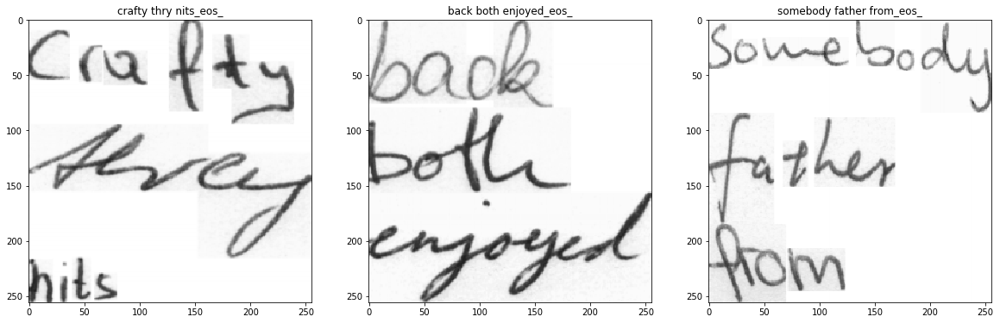

In [69]:
#valid
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(v_res[i])
    ax=show_img(imgs[i], ax=ax, title=p)

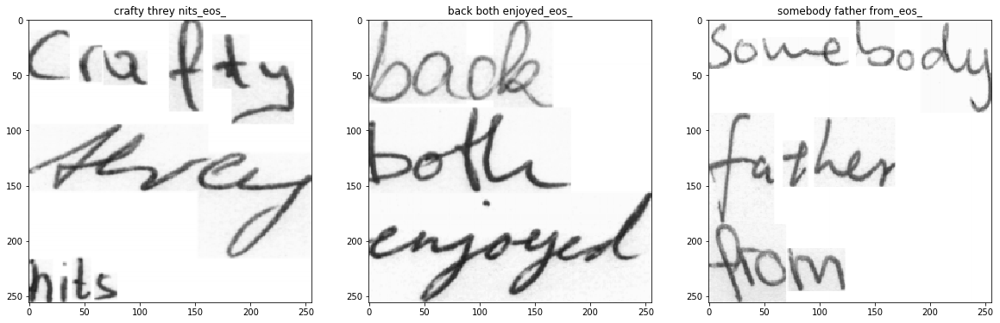

In [70]:
#greedy
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(g_res[i])
    ax=show_img(imgs[i], ax=ax, title=p)

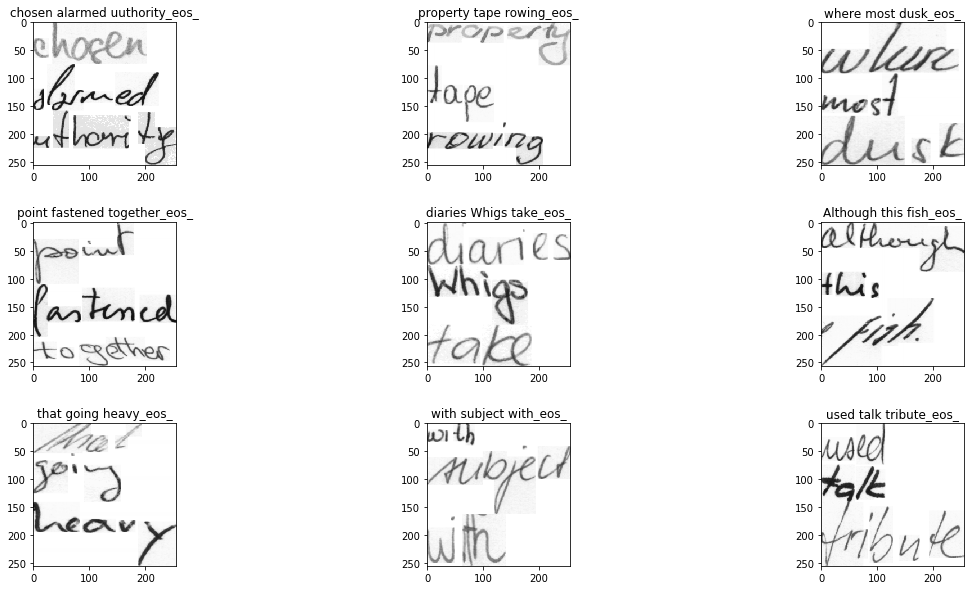

In [56]:
#valid
fig, axes = plt.subplots(3,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(v_res[i])
    ax=show_img(imgs[i], ax=ax, title=p)

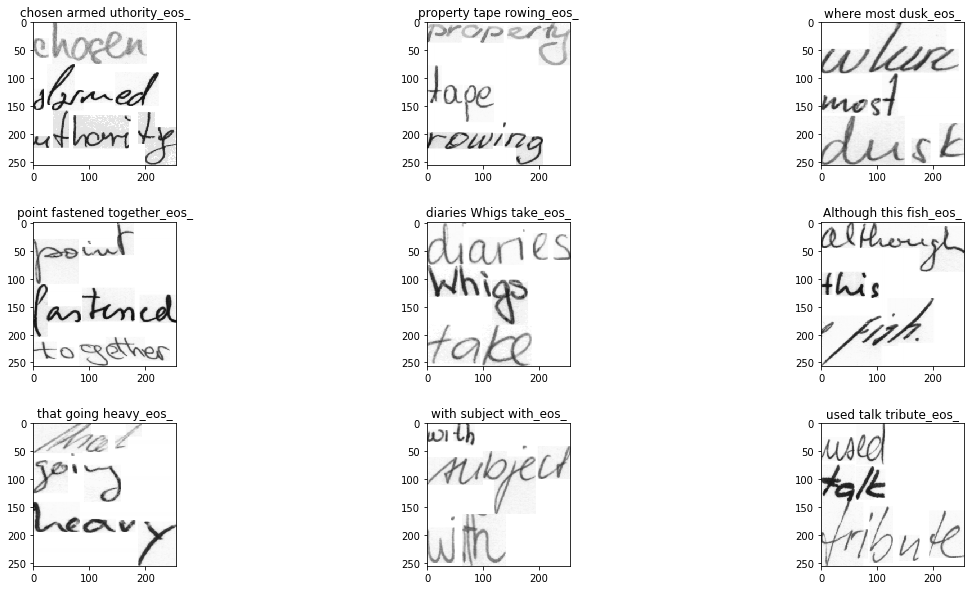

In [57]:
#greedy
fig, axes = plt.subplots(3,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(g_res[i])
    ax=show_img(imgs[i], ax=ax, title=p)

### Source Attn

In [71]:
idx = 1
img = imgs[idx]

v_chars = v_res[idx]
v_attns = to_np(torch_scale_attns(v_attn)[idx])

g_chars = g_res[idx]
g_attns = to_np(torch_scale_attns(g_attn)[idx])

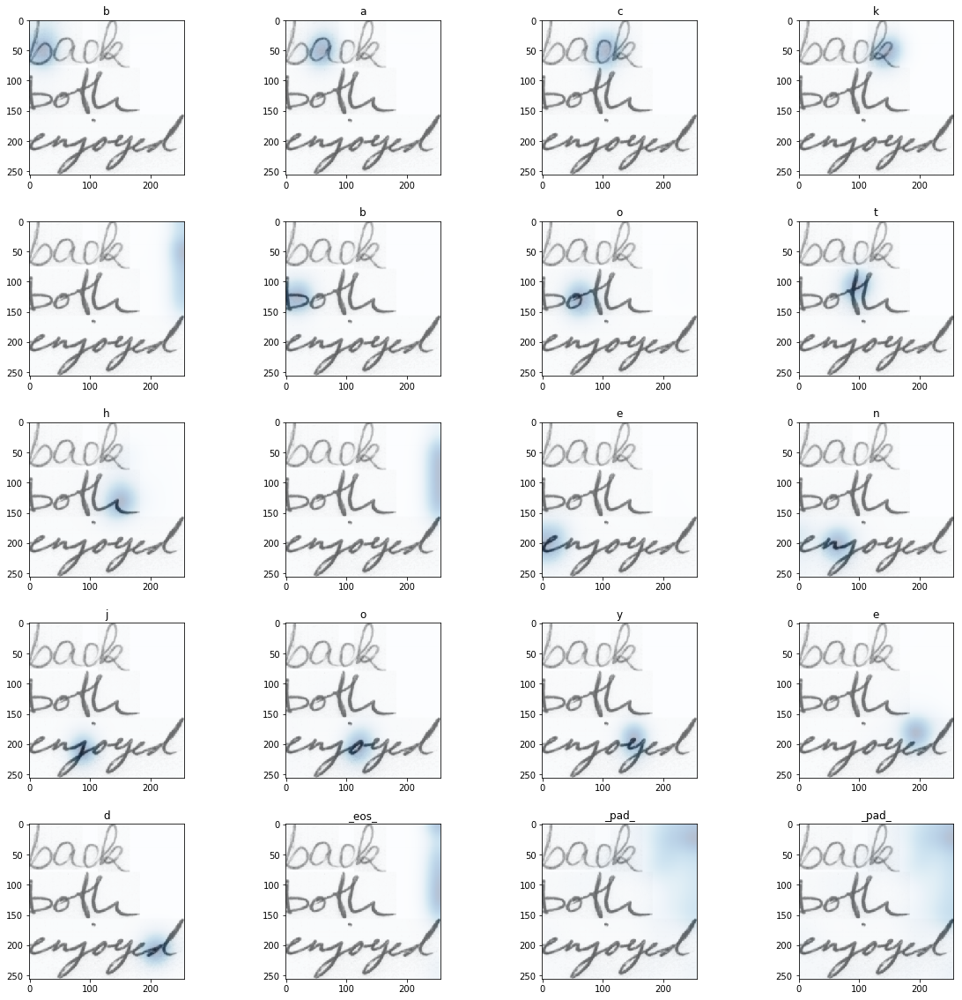

In [76]:
#valid
fig, axes = plt.subplots(5,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    a = g_filter(v_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[v_chars[i].item()])

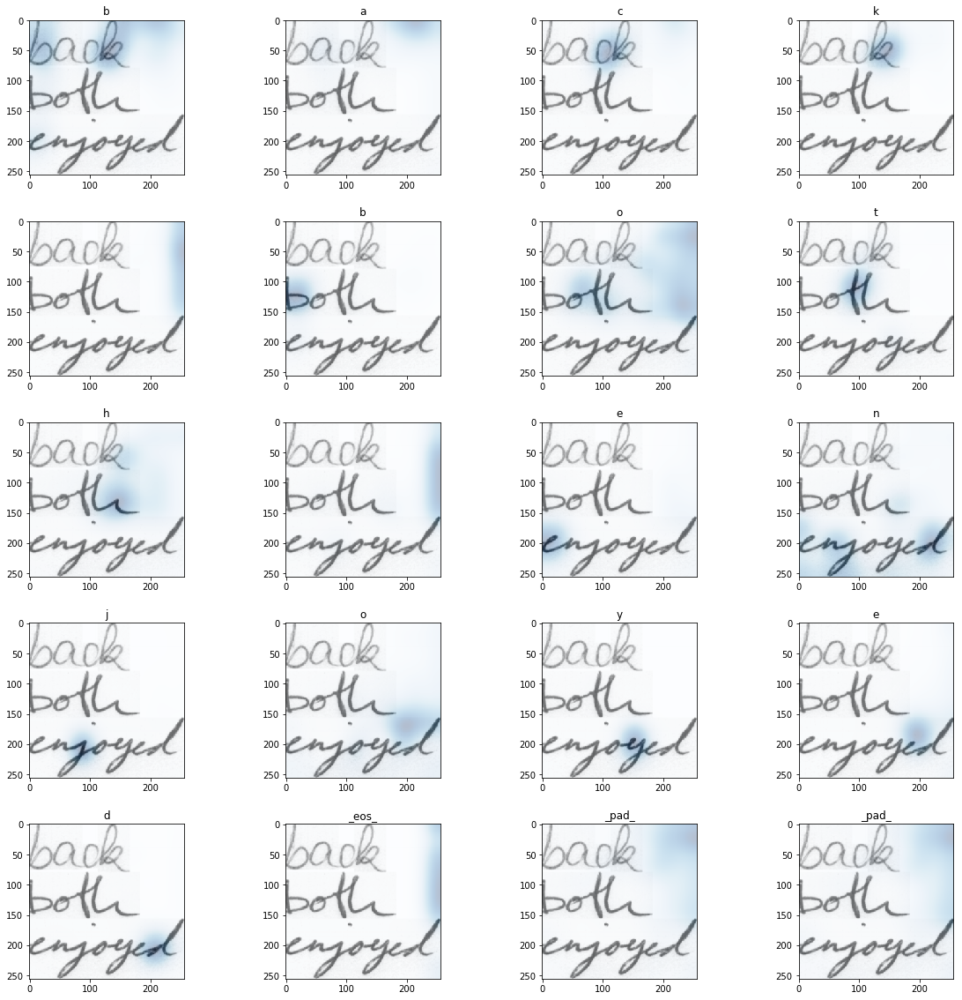

In [77]:
#greedy
fig, axes = plt.subplots(5,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    a = g_filter(g_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[g_chars[i].item()])

## 3x2 400

### Images

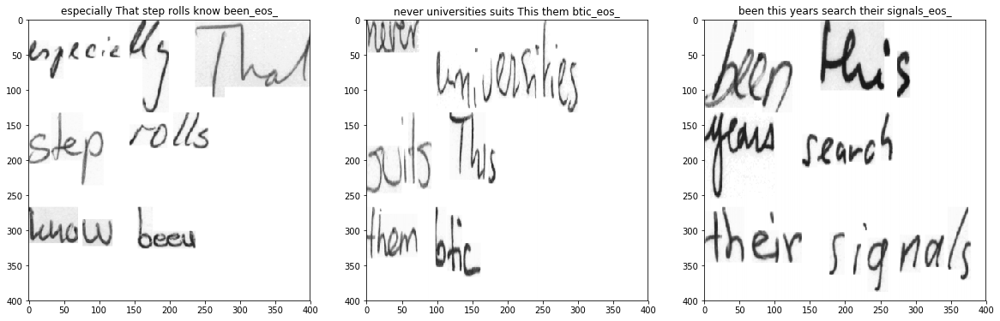

In [88]:
#valid
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(v_res[i])
    ax=show_img(imgs[i], ax=ax, title=p)

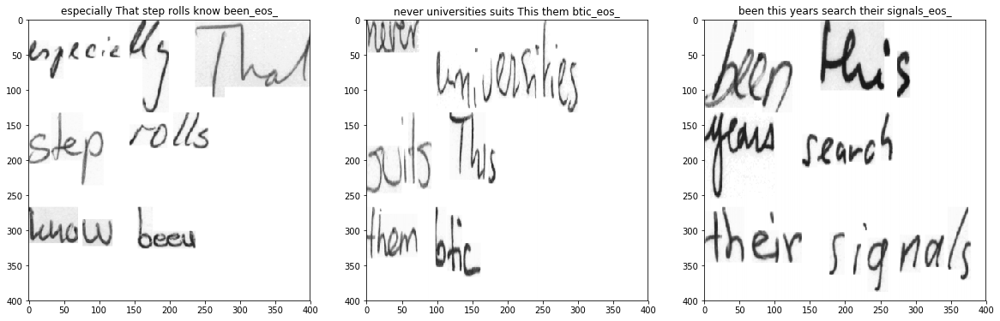

In [89]:
#greedy
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(g_res[i])
    ax=show_img(imgs[i], ax=ax, title=p)

### Source Attn

In [90]:
idx = 1
img = imgs[idx]

v_chars = v_res[idx]
v_attns = to_np(torch_scale_attns(v_attn)[idx])

g_chars = g_res[idx]
g_attns = to_np(torch_scale_attns(g_attn)[idx])

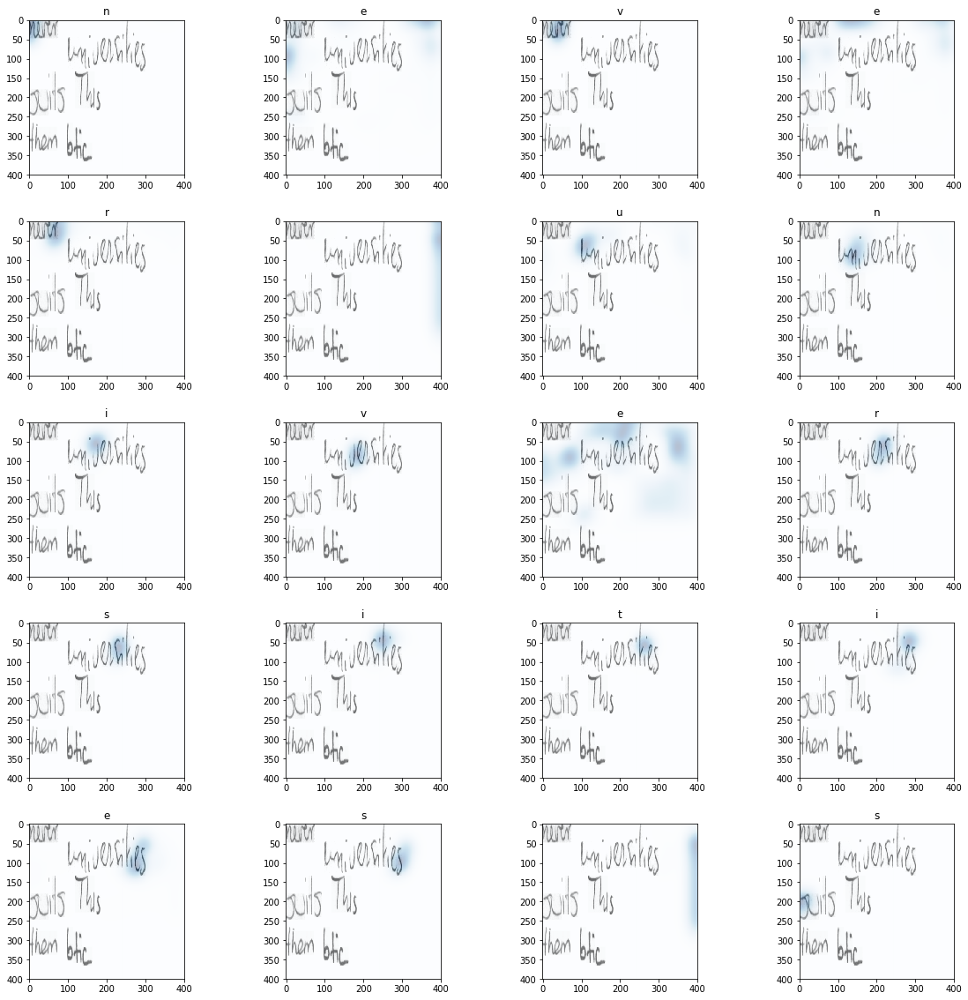

In [91]:
#valid
fig, axes = plt.subplots(5,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    a = g_filter(v_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[v_chars[i].item()])

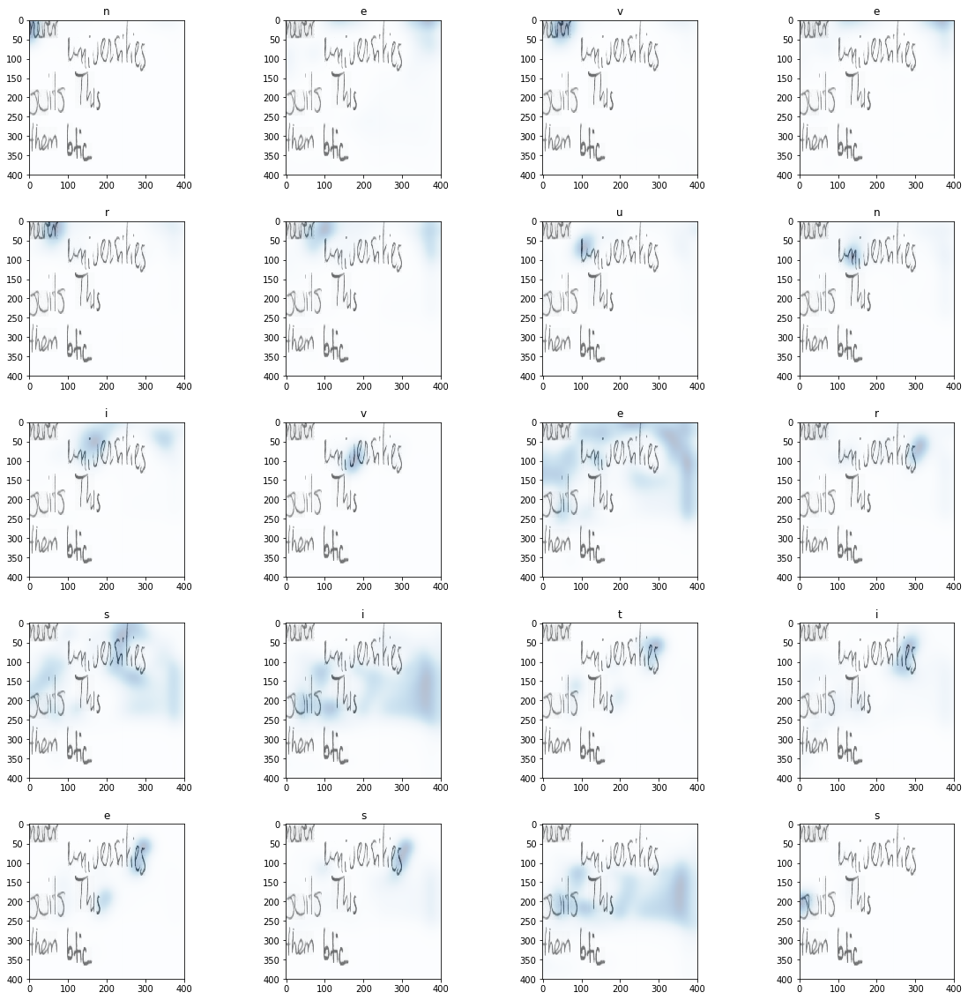

In [92]:
#greedy
fig, axes = plt.subplots(5,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    a = g_filter(g_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[g_chars[i].item()])

## lg 512

### Images

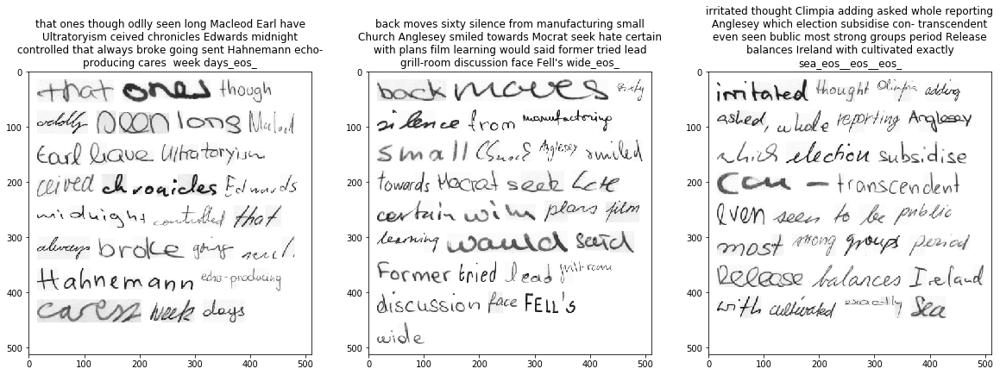

In [49]:
#valid
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(v_res[i], chunk=55)
    ax=show_img(imgs[i], ax=ax, title=p)

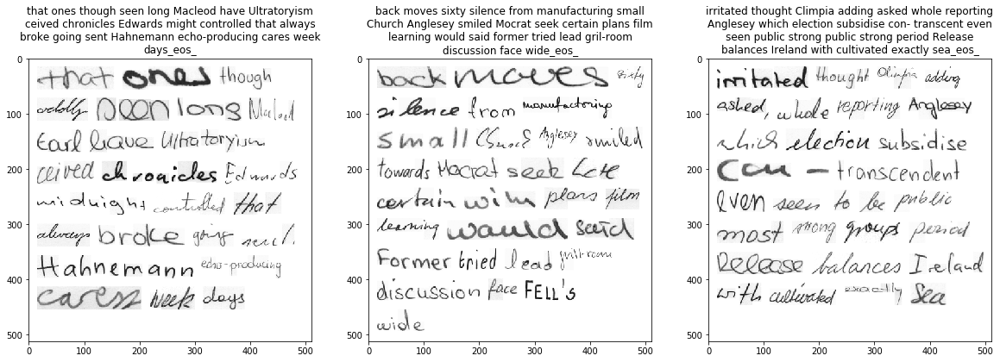

In [50]:
#greedy
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(g_res[i], chunk=55)
    ax=show_img(imgs[i], ax=ax, title=p)

### Source Attn

In [51]:
idx = 1
img = imgs[idx]

v_chars = v_res[idx]
v_attns = to_np(torch_scale_attns(v_attn)[idx])

g_chars = g_res[idx]
g_attns = to_np(torch_scale_attns(g_attn)[idx])

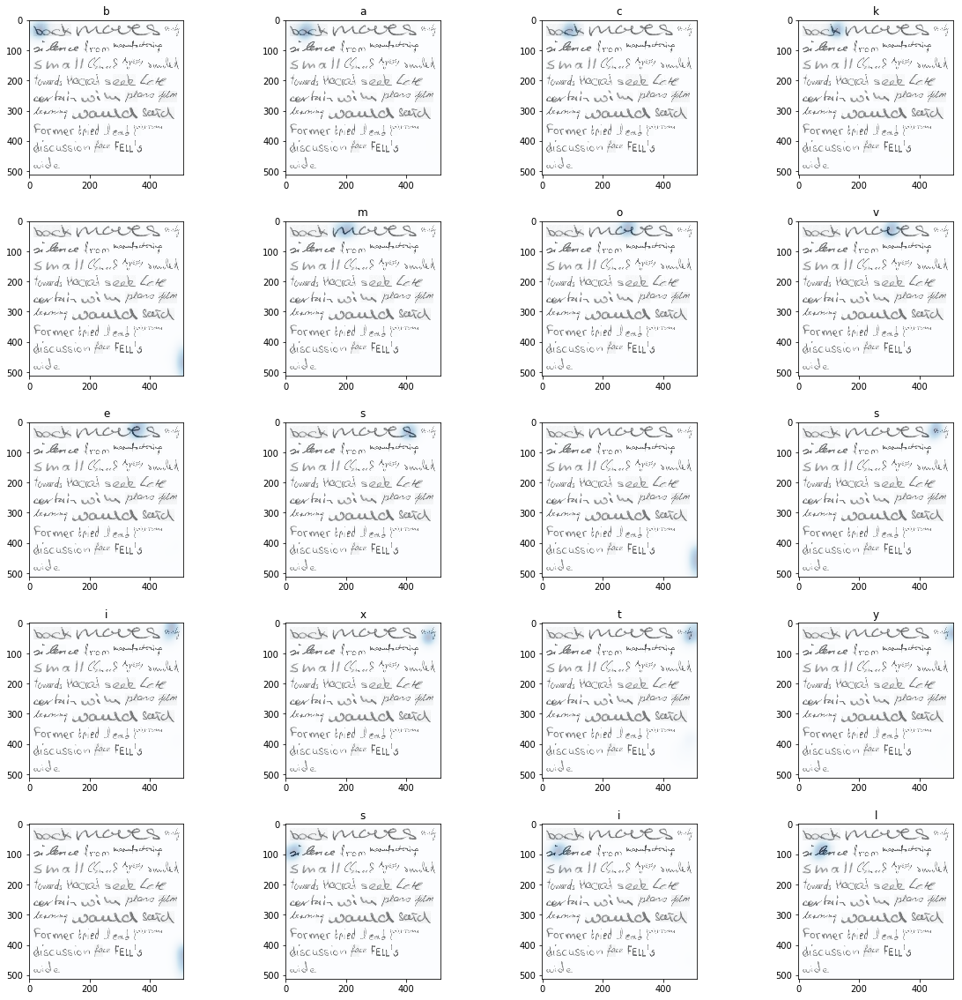

In [52]:
#valid
fig, axes = plt.subplots(5,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    a = g_filter(v_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[v_chars[i].item()])

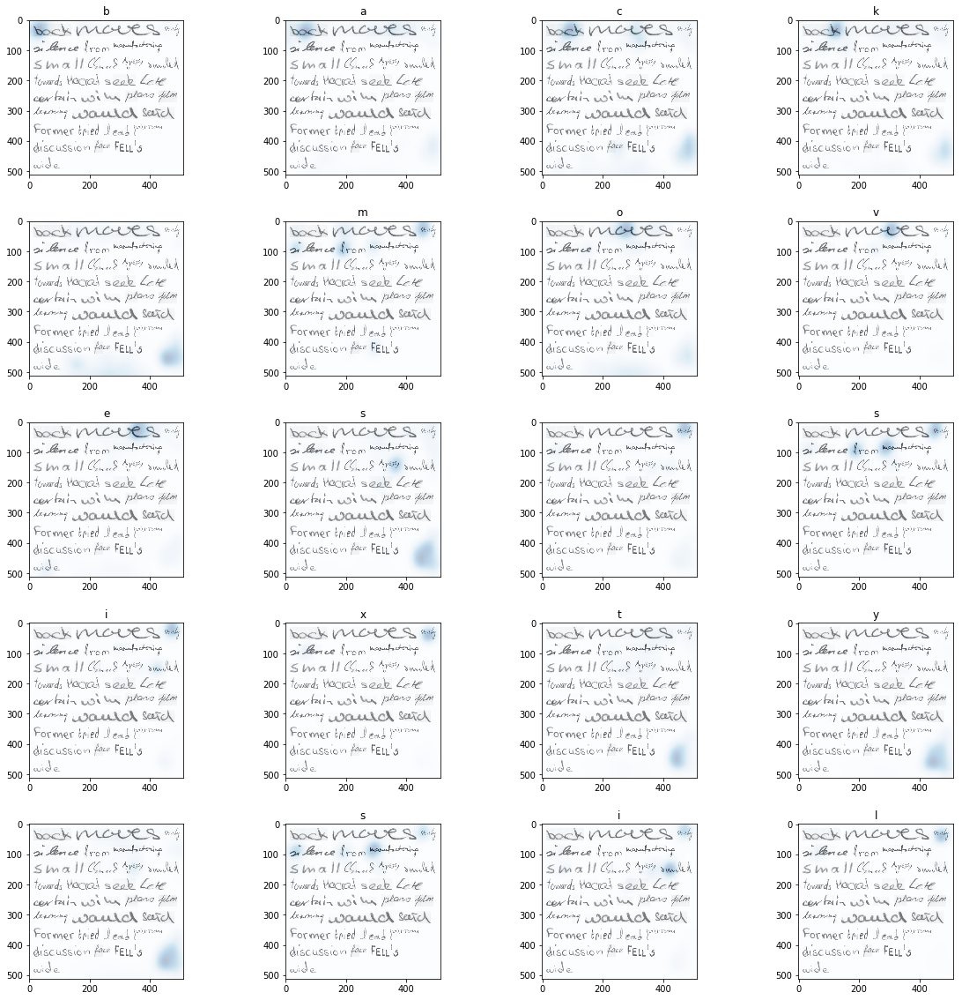

In [53]:
#greedy
fig, axes = plt.subplots(5,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    a = g_filter(g_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[g_chars[i].item()])

## cat 9-12

### Images

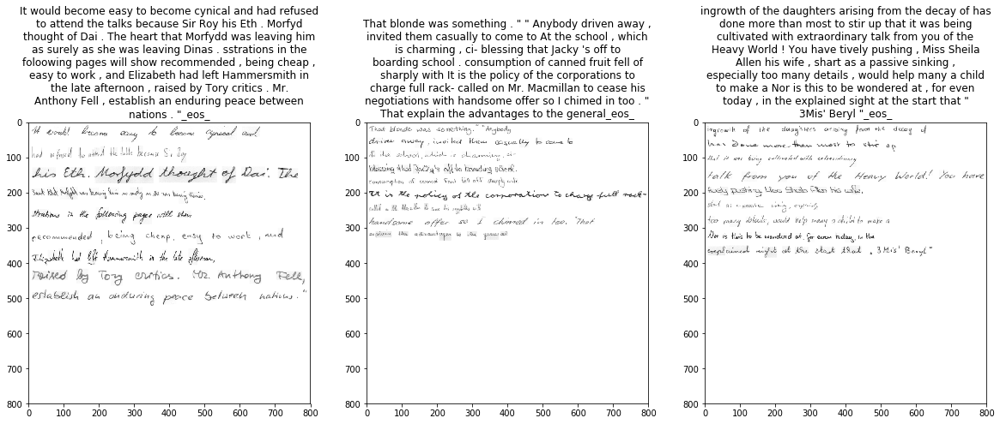

In [50]:
#valid
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(v_res[i], chunk=55)
    ax=show_img(imgs[i], ax=ax, title=p)

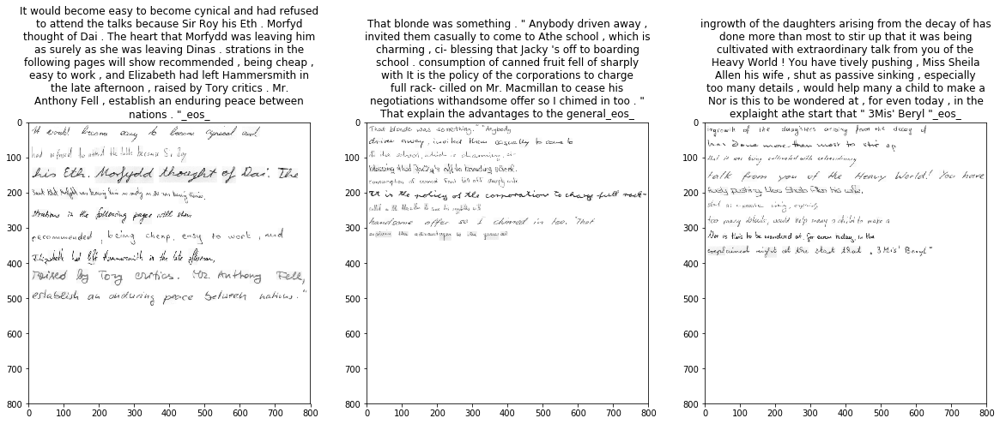

In [51]:
#greedy
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(g_res[i], chunk=55)
    ax=show_img(imgs[i], ax=ax, title=p)

### Source Attn

In [ ]:
idx = 1
img = imgs[idx]

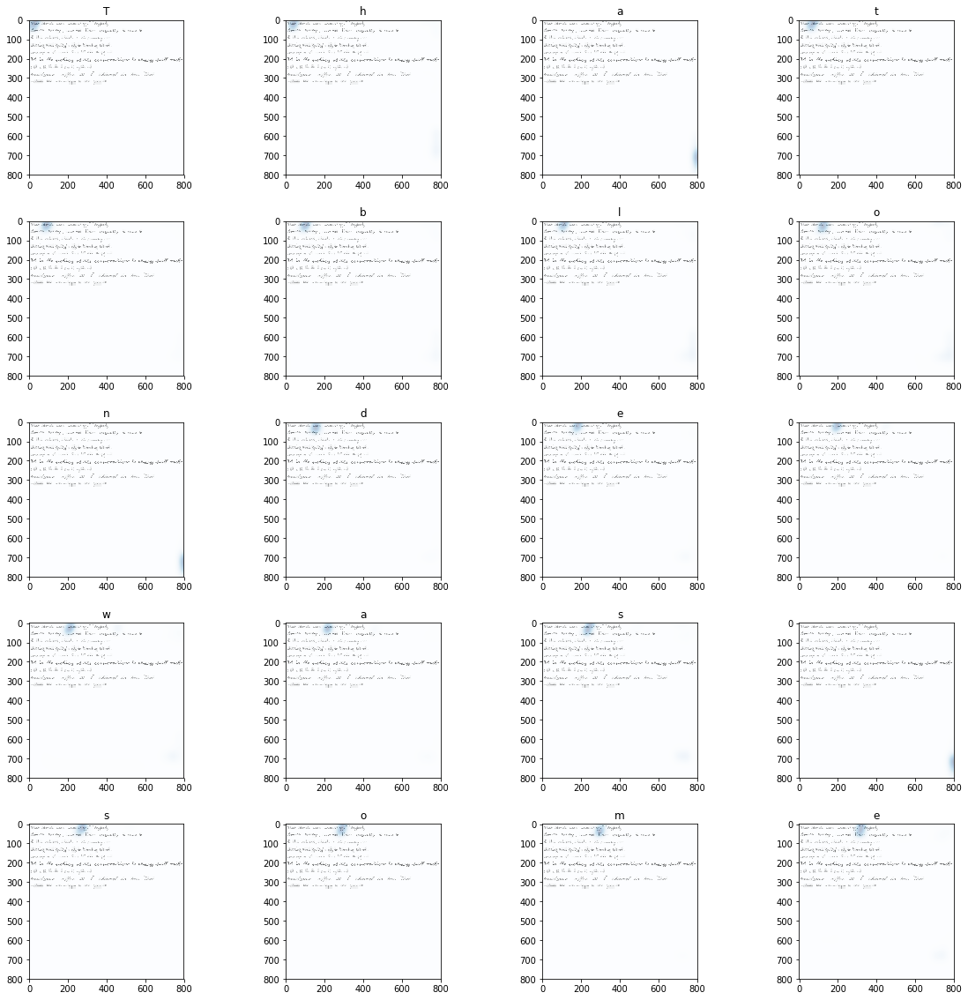

In [58]:
#valid
v_chars = v_res[idx]
v_attns = to_np(torch_scale_attns(v_attn[:idx, :20]))[-1]

fig, axes = plt.subplots(5,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    
    a = g_filter(v_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[v_chars[i].item()])
    
del v_attns

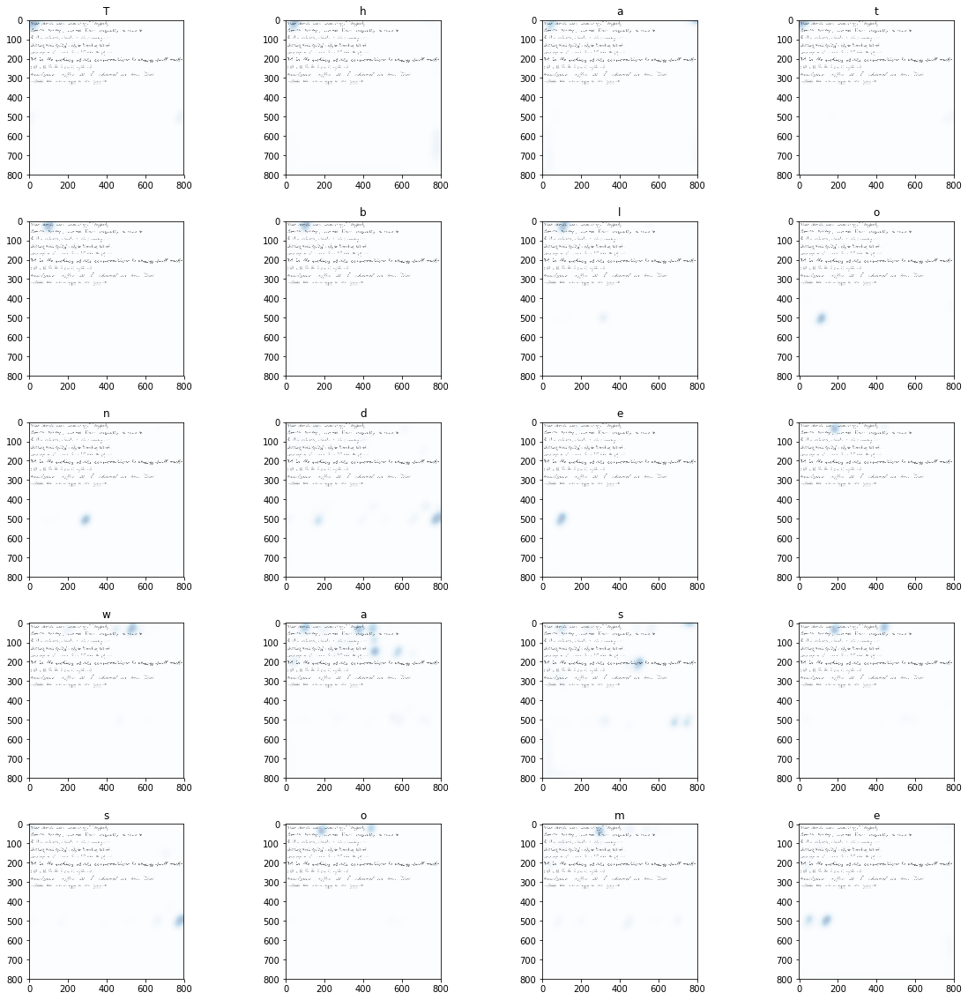

In [59]:
#greedy
g_chars = g_res[idx]
g_attns = to_np(torch_scale_attns(g_attn[:idx, :20]))[-1]

fig, axes = plt.subplots(5,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    a = g_filter(g_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[g_chars[i].item()])

## pg

### Images

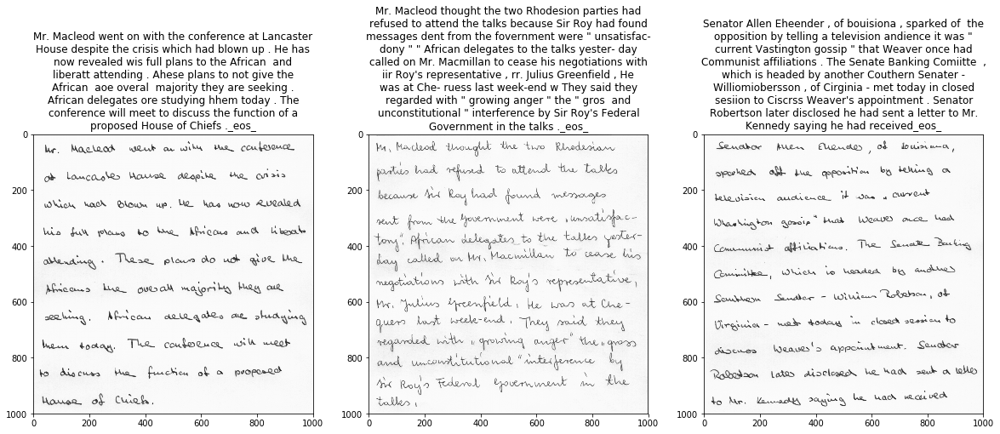

In [73]:
#valid
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(v_res[i], chunk=55)
    ax=show_img(imgs[i], ax=ax, title=p)

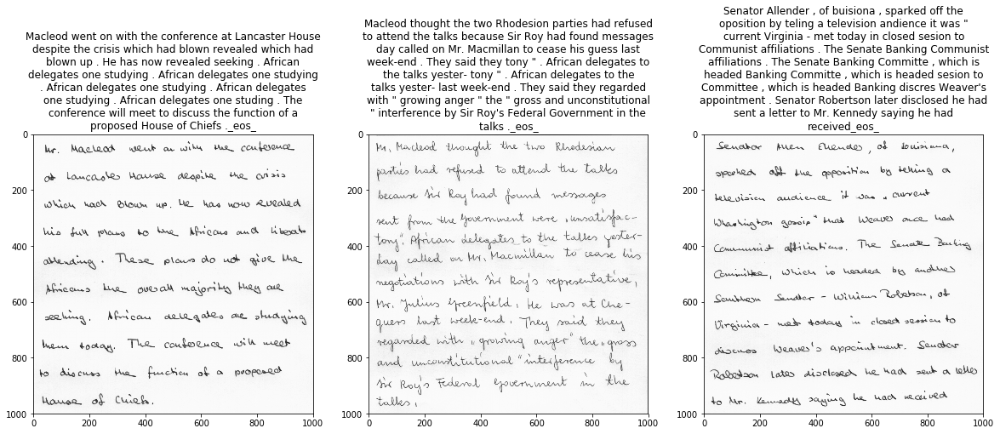

In [74]:
#greedy
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(g_res[i], chunk=55)
    ax=show_img(imgs[i], ax=ax, title=p)

### Source Attn

In [75]:
idx = 1
img = imgs[idx]

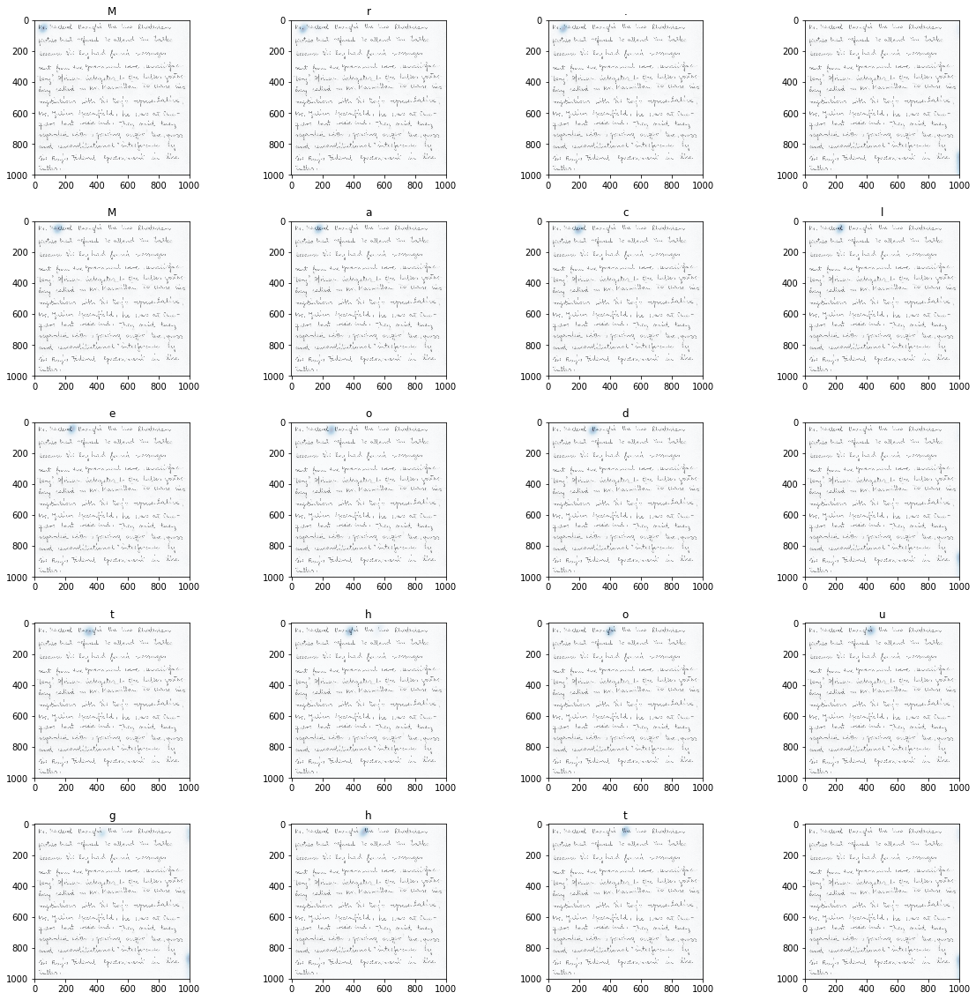

In [76]:
#valid
v_chars = v_res[idx]
v_attns = to_np(torch_scale_attns(v_attn[:idx, :20]))[-1]

fig, axes = plt.subplots(5,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    
    a = g_filter(v_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[v_chars[i].item()])
    
del v_attns

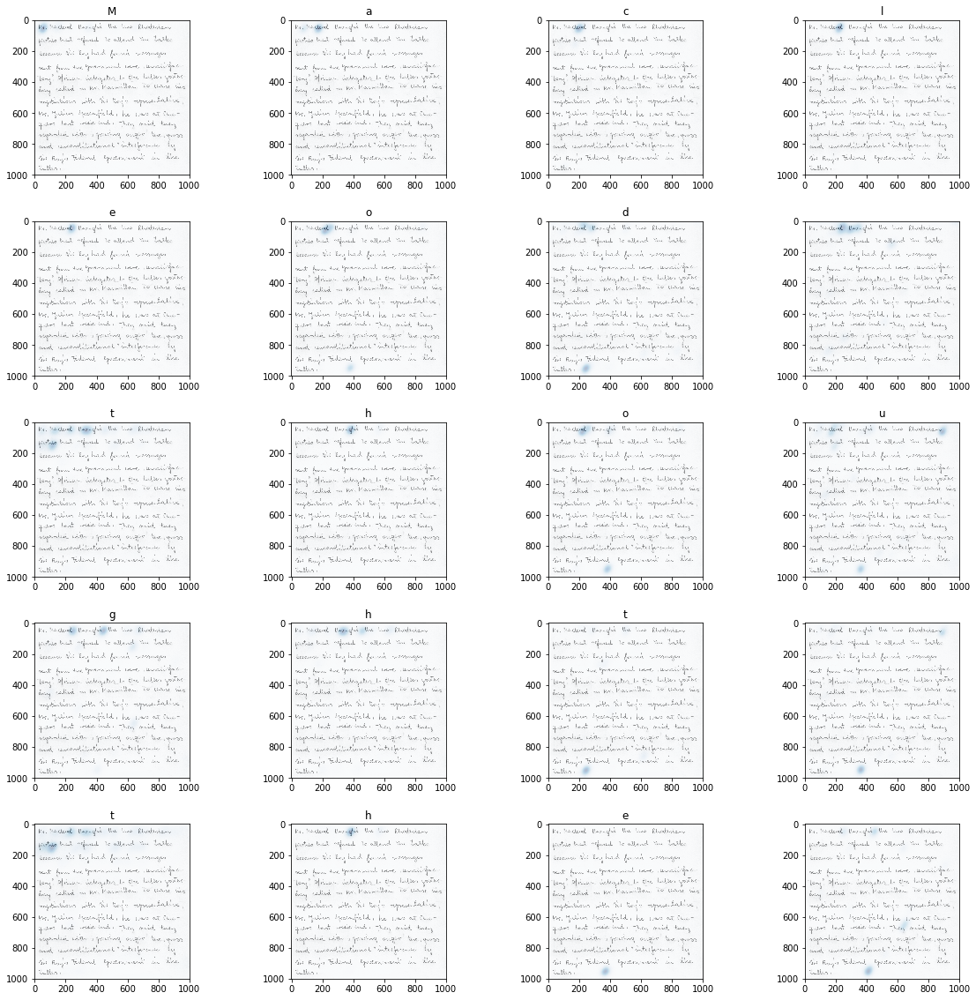

In [77]:
#greedy
g_chars = g_res[idx]
g_attns = to_np(torch_scale_attns(g_attn[:idx, :20]))[-1]

fig, axes = plt.subplots(5,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    a = g_filter(g_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[g_chars[i].item()])

# Beam Search

## Multi-Batch Beam Decode

In [119]:
def beam_cer(preds, targs):
    bs = preds.size(0)
    error = 0
    for i in range(bs):
        p = char_label_text(preds[i])
        t = char_label_text(targs[i])
        error += _cer(t,p)
    return error/bs

In [120]:
def repeat_interleave(tensor,n):
    res = []
    for i in range(tensor.size(0)):
        for _ in range(n): res.append(tensor[i])
    return torch.stack(res)

In [50]:
# def normalize_score(score, i, alpha=0.6):
#     length_penalty = math.pow((5 + i)/6, alpha)
#     return score/length_penalty

### Beam Object

In [56]:
import heapq

class Beam(object):
    def __init__(self, beam_width=10):
        self.heap = list()
        self.beam_width = beam_width
        self.best_score = None

    def add(self, score, complete, seq):        
        heapq.heappush(self.heap, (score, complete, seq))
        if len(self.heap) > self.beam_width:
            heapq.heappop(self.heap)
            
    def get_seq(self):
        return [b[-1] for b in self.heap]
        
    def __iter__(self):
        return iter(self.heap)

In [88]:
class BeamSearch(nn.Module):
    def __init__(self, net, beam_width, seq_len, end_tok=0):
        super(BeamSearch, self).__init__()
        self.img_enc = net.img_enc
        self.transformer = net.transformer
        self.bw = beam_width
        self.seq_len = seq_len
        self.end_tok = end_tok
        self.feats = None
        self.beams = []
            
    def forward(self, src):
        with torch.no_grad():
            bs = src.size(0)
            
            # initialize beam per bs
            for _ in range(bs):
                beam = Beam(self.bw)
                beam.add(0.0, False, [1])
                self.beams.append(beam)
                
            # encode src
            self.feats = self.transformer.encode(self.img_enc(src))
            
            for i in tqdm(range(seq_len)):
                # gather sequences from beams; combine into tensor (bs*bw)
                prev_seq = torch.from_numpy(np.stack([b.get_seq() for b in self.beams])).view(-1,i+1)
                
                # generate new possibilities
                log_probs, chars = self.prob_func(prev_seq.to(device))
                log_probs, chars = log_probs.view(bs,-1,self.bw), chars.view(bs,-1,self.bw)
                
                for j in range(bs):
                    curr_beam = Beam(self.bw)
                    for k,(score, complete, seq) in enumerate(self.beams[j]):
                        for l,c in zip(log_probs[j,k],chars[j,k]):
                            log_prob,char = l.item(), c.item()
                            curr_beam.add((score+log_prob), (char==self.end_tok), seq+[char])
                    self.beams[j] = curr_beam
  
                # return if all max beams are complete
                if (self.top_complete()==True).all(): break
                    
                # expand feats to match beam size (only on 2nd run)
                if i==0: self.feats = repeat_interleave(self.feats, self.bw)

            return self.top_seq()

    def top_complete(self): return np.stack([max(b)[1] for b in self.beams])
    def top_seq(self): return torch.from_numpy(np.stack([max(b)[-1] for b in self.beams]))[:,1:]

    def prob_func(self, tgt):
        mask = subsequent_mask(tgt.size(-1))
        dec_outs = self.transformer.decode(self.feats, Variable(tgt), Variable(mask))
        logits = self.transformer.generate(dec_outs[:,-1])
        log_probs = logits - torch.logsumexp(logits, -1, keepdim=True) # more stable than F.softmax(logits,-1).log()
        return torch.topk(log_probs, self.bw, dim=-1)

In [89]:
search = BeamSearch(learn.model, 3, seq_len)
b_res = search(x)

# bw: 3, sl: 350, ~56s, 0.02491    # no normalized_score

 75%|███████▍  | 56/75 [04:29<01:37,  5.13s/it]

In [90]:
beam_cer(b_res,y)

0.03132364489591045

### Tensors

In [121]:
class BeamSearch(nn.Module):
    def __init__(self, net, beam_width, seq_len):
        super(BeamSearch, self).__init__()
        self.img_enc = net.img_enc
        self.transformer = net.transformer
        self.bw = beam_width
        self.seq_len = seq_len
        
        self.feats = None
        self.beam = None
        self.scores = None
        
        net.eval()
    
    def forward(self, src):
        with torch.no_grad():
            bs = src.size(0)
            
            # encode src
            self.feats = self.transformer.encode(self.img_enc(src))
            
            # initialize globals (beam=1 for first iteration; 3 thereafter)
            self.beam = torch.ones((bs,1), device=device, dtype=torch.long)
            self.scores = torch.zeros((bs,1), device=device, dtype=torch.float)
            
            for i in tqdm(range(seq_len)):
                # generate new topk chars per beam(bs*bw)
                log_probs, chars = self.prob_func(self.beam)  #(bs*beam, 3)

                # compute local scores
                scores = self.scores + log_probs
                
                # compute new beams per batch
                new_scores, idxs = torch.topk(scores.view(bs,-1), self.bw, dim=-1) #(bs, 3)
                self.scores = new_scores.view(-1,1)
                
                # set up new beam:
                nxt = torch.stack([c[i] for c,i in zip(chars.view(bs,-1),idxs)]).view(-1,1)
                pre = torch.stack([b[i//self.bw] for b,i in zip(self.beam.view(bs,-1,i+1),idxs)]).view(-1,i+1)
                                    
                # update globals
                self.beam = torch.cat([pre,nxt], dim=1)

                # end when top of beams are complete
                if self.top_complete(): break
                                                        
                # expand feats to match beam size (only on 2nd run)
                if i==0: self.feats = repeat_interleave(self.feats, self.bw) #.repeat(self.bw,1,1)
                    
            return self.top_sequences(), self.top_scores() 


    def top_complete(self): return (self.top_sequences()[:,-1]==0).all().item()   #byte tensor
    def top_sequences(self): return self.beam.squeeze()[0::self.bw][:,1:]
    def top_scores(self): return self.scores.squeeze()[0::self.bw]

    def prob_func(self, tgt):
        mask = subsequent_mask(tgt.size(-1))
        dec_outs = self.transformer.decode(self.feats, Variable(tgt), Variable(mask))
        logits = self.transformer.generate(dec_outs[:,-1])
        log_probs = logits - torch.logsumexp(logits, -1, keepdim=True) # more stable than F.softmax(logits,-1).log()
        return torch.topk(log_probs, self.bw, dim=-1)

In [122]:
search = BeamSearch(learn.model, 3, seq_len)
b_res,score = search(x)

# lg, sl: 250
# bw: 1, ~12s, 0.02398
# bw: 3, ~28s, 0.02378
# bw: 5, ~46s, 0.02378

# pg: 1000,5
# bs: 3, ~40s, 0.33227  (greedy: 0.28---)
# ''   , ~30s, 0.22635  (greedy: 0.23726)

# pg: 800,8
# bs: 3, ~51s, 0.25424  (greedy: 0.28348)

 32%|███▎      | 65/200 [00:07<00:19,  6.81it/s]

In [59]:
beam_cer(b_res,y)

0.1069689709545489

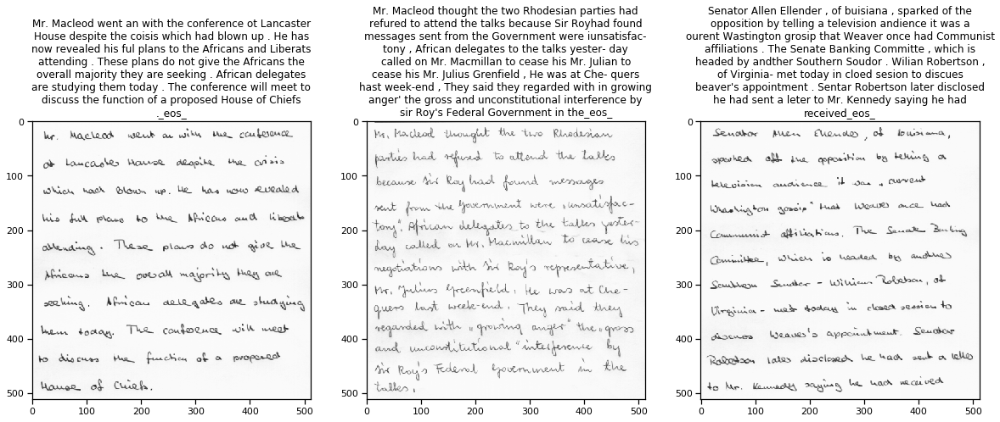

In [75]:
#beam
fig, axes = plt.subplots(1,3, gridspec_kw={'hspace': 0.4}, figsize=(20, 10))
for i,ax in enumerate(axes.flat):
    p = char_label_text(b_res[i], chunk=55)
    ax=show_img(imgs[i], ax=ax, title=p)

## Single Beam Decode

In [76]:
# https://geekyisawesome.blogspot.com/2016/10/using-beam-search-to-generate-most.html

import heapq

class Beam(object):
    '''
    For comparison of prefixes, the tuple (prefix_probability, complete_sentence) is used.
    This is so that if two prefixes have equal probabilities then a complete sentence
    is preferred over an incomplete one since (0.5, False) < (0.5, True)
    '''

    def __init__(self, beam_width=10):
        self.heap = list()
        self.beam_width = beam_width
        self.best_score = None

    def add(self, score, complete, seq):        
        # keep track of best_score so far
        if self.best_score is None or score > self.best_score:
            self.best_score = score
            
        # only add to beam if score is not more than beam_width below the best_score
        if score > self.best_score-self.beam_width:
            heapq.heappush(self.heap, (score, complete, seq))
            
        # maintain beam_width
        if len(self.heap) > self.beam_width:
            heapq.heappop(self.heap)
                
    def __iter__(self):
        return iter(self.heap)

In [77]:
def beamsearch(prob_fn, seq_len, beam_width=5, start_tok=1, end_tok=3):
    prev_beam = Beam(beam_width)
    prev_beam.add(0.0, False, [start_tok])
    
    for i in tqdm(range(seq_len)):
        curr_beam = Beam(beam_width)
        
        # iterate over each beam
        for (score, complete, seq) in prev_beam:
            if complete == True:
                None  # only keep the completed best beam!!
#                 curr_beam.add(score, True, seq)
            else:
                # iterate through topk chars, calculating scores and adding to the beam.
                log_probs, chars = prob_fn(seq)
                for log_prob, char in zip(log_probs, chars): 
                    log_prob,char = log_prob.item(), char.item()
                    score += log_prob   #log probabilities are additive
#                     score = score_func(score, len(seq))
                    curr_beam.add(score, (char==end_tok), seq+[char])
        
        (best_score, best_complete, best_seq) = max(curr_beam)
        if best_complete == True: return (best_seq[1:], best_score)   # returns first complete beam not best...
            
        prev_beam = curr_beam
        
    (best_score, best_complete, best_seq) = max(curr_beam)
    return (best_seq[1:], best_score)

In [78]:
def beam_decode(net, src, beam_width, seq_len):
    net.eval()
    with torch.no_grad():
        feats = net.transformer.encode(net.img_enc(src))        
        return beamsearch(partial(prob_func, net=net, feats=feats, beam_width=beam_width), seq_len, beam_width)
    
def prob_func(tgt, net=None, feats=None, beam_width=5):
    tgt = torch.tensor([tgt], dtype=torch.long, device=device)
    mask = subsequent_mask(tgt.size(-1))
    dec_outs = net.transformer.decode(feats, Variable(tgt), Variable(mask))
    logits = net.transformer.generate(dec_outs[:,-1])
    
    log_probs = logits - torch.logsumexp(logits, 1)  # more numerically stable
    # log_probs = F.softmax(logits, -1).log()
    
    return torch.topk(log_probs.squeeze(0), beam_width, dim=-1)
#     return zip(res[0][0].detach(),res[1][0].detach())

def score_func(log_probs, i, alpha=0.6):
    length_penalty = math.pow((5 + i)/6, alpha)
    return log_probs/length_penalty

In [140]:
idx = 2
x1 = x[idx][None]
y1 = y[idx][None]

In [79]:
b_res, score = beam_decode(learn.model, image, 3, seq_len)    #294, 3m18s
# 294 - 1m40s
# 294 - 1m45s (w/ score_func)
# 295 - 22s (beam_width=1 ~ greedy)

 48%|████▊     | 95/200 [00:11<00:14,  7.34it/s]

In [118]:
r = torch.tensor([b_res], dtype=torch.long, device=device)
p = char_label_text(r)

_cer(truth, p)

0.13953488372093023

In [142]:
# valid
p = char_label_text(v_res[idx][None])
t = char_label_text(y1[0])
_cer(t,p)

0.04044117647058824

In [143]:
# greedy
p = char_label_text(g_res[idx][None])
t = char_label_text(y1[0])
_cer(t,p)

0.20220588235294118

In [144]:
# beam (sz=3)
r = torch.tensor([b_res], dtype=torch.long, device=device)
p = char_label_text(r)
t = char_label_text(y1[0])
_cer(t,p)

0.16176470588235295

In [83]:
stoi = {k:i for i,k in enumerate(itos)}

In [145]:
print(char_label_text(g_res[idx][None]))

weapon personal rally together minds their land precise Premier booked
value terrible love caught Burdett from took been regard centre Labour
when Research tastes Mauro's large been Consumer tight-lipped 1960s
aluminium fifty pushing suffering expecting succeeded many away room
cultivated conted contintinted coulted continuated
coultinultintinuoult


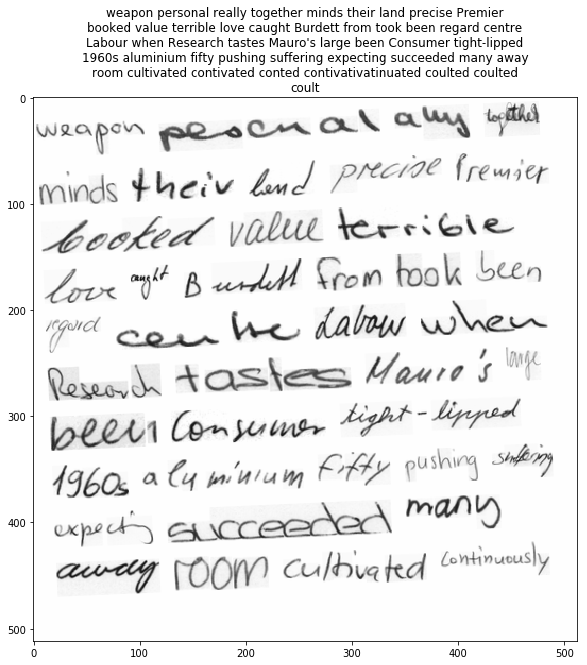

In [146]:
st = ''.join([itos[i] for i in b_res])
p = '\n'.join(textwrap.wrap(st, 70))
show_img(denorm(x1)[0], figsize=(10,10), title=p)

## Source Attn

In [102]:
idx = 0
img = imgs[idx]

v_chars = v_res[idx]
v_attns = to_np(torch_scale_attns(v_attn)[idx])

g_chars = g_res[idx]
g_attns = to_np(torch_scale_attns(g_attn)[idx])

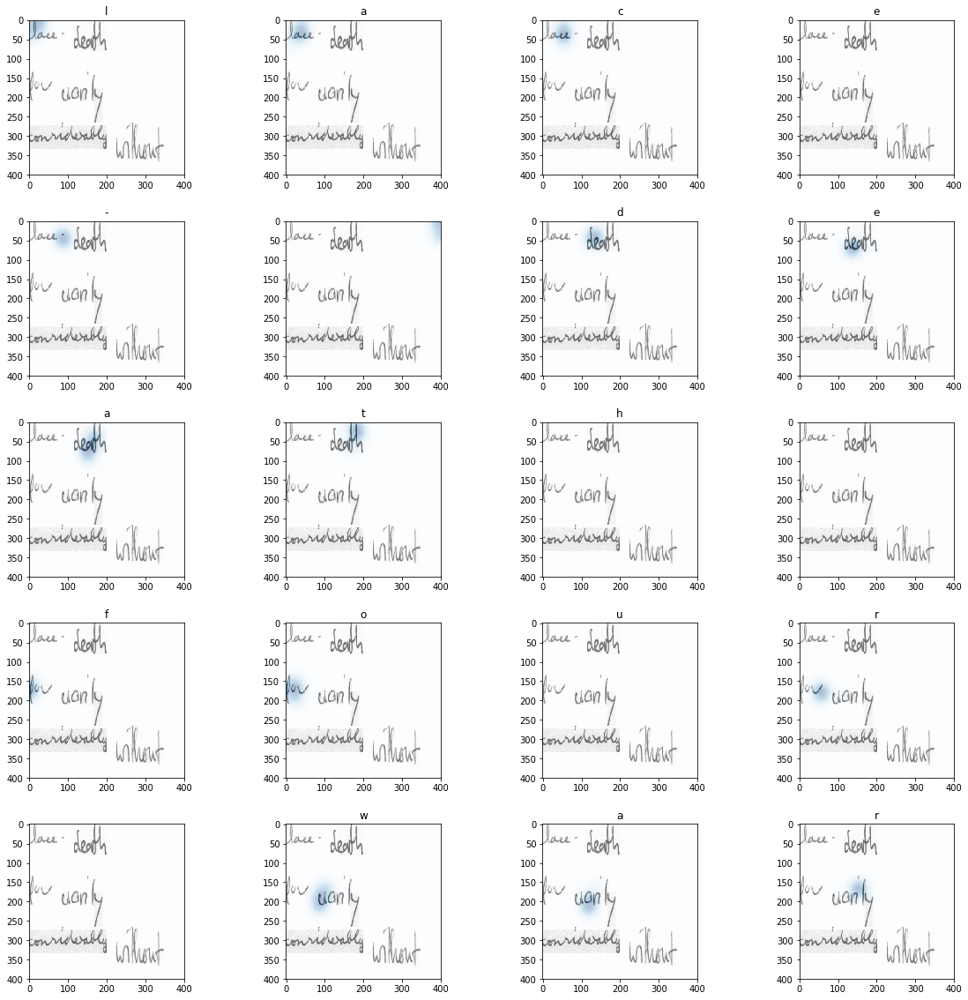

In [104]:
#valid
fig, axes = plt.subplots(5,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    a = g_filter(vv_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[v_chars[i].item()])

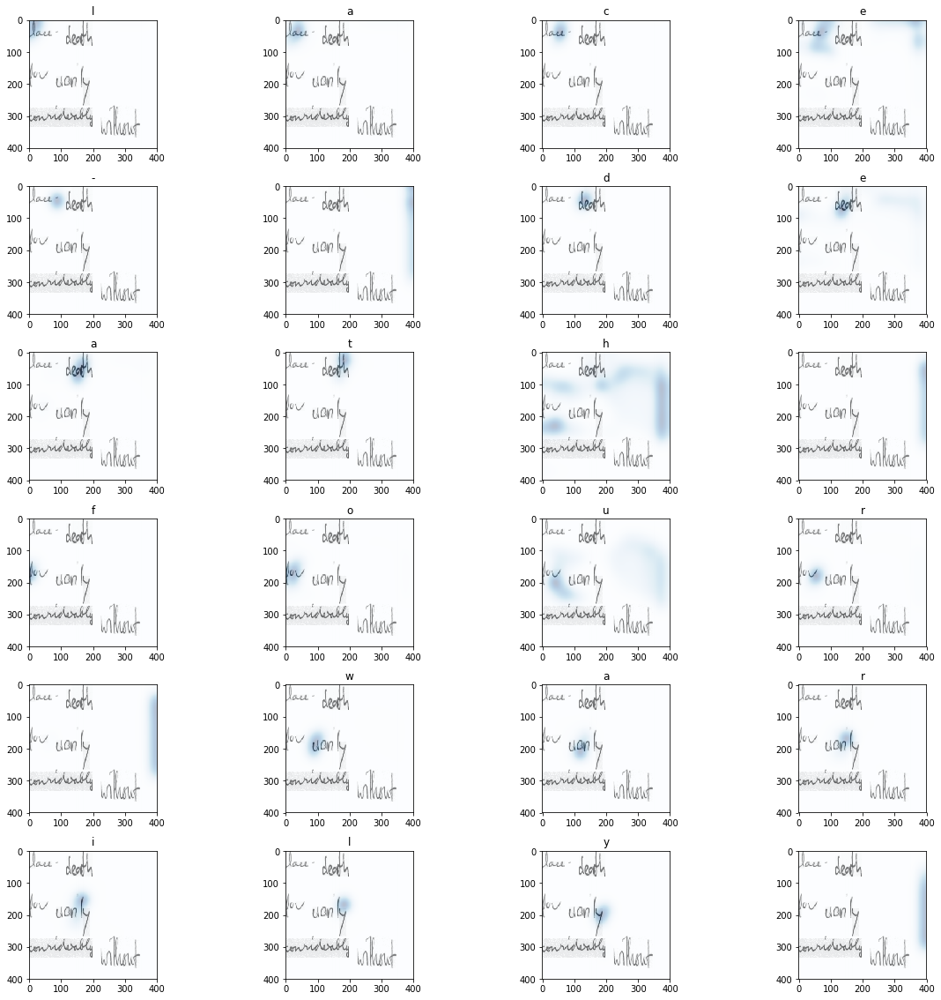

In [60]:
#greedy
fig, axes = plt.subplots(6,4, gridspec_kw={'hspace': 0.3}, figsize=(20, 20))
for i,ax in enumerate(axes.flat):
    a = g_filter(g_attns[i])
    ax.imshow(img, alpha=None)
    ax.imshow(a, cmap='Blues', interpolation='nearest', alpha=0.3)
    ax.set_title(itos[g_chars[i].item()])

# Attention Visualizations

In [137]:
def transparent_cmap(cmap, N=5):
    "Copy colormap and set alpha values"
    mycmap = matplotlib.cm.get_cmap(cmap, N)
    mycmap._init()
    mycmap._lut[:,-1] = np.linspace(0, 0.6, N+3)
    return mycmap

#Use base cmap to create transparent
# mycmap = transparent_cmap(plt.cm.Reds)

In [138]:
def show_attn(img, attns, chars, ax, color, showChars=True):
    for i in range(attns.shape[0]):
        c = chars[i].item()
        if c not in [0,1,2,3]:
            a = g_filter(attns[i])
            y,x = scipy.ndimage.center_of_mass(a)
            #sns.heatmap(a, cmap=mycmap, cbar=False, ax=ax)
            ax.imshow(a, cmap=transparent_cmap(color), interpolation='nearest')
            if showChars: ax.text(x-8,y-10,itos[c], fontsize=15)

    ax.set_title(char_label_text(chars))
    ax.imshow(img, alpha=0.6)

In [139]:
def thresh_attn(attn, thresh=0.1):
    zeros = torch.zeros_like(attn)
    new = torch.where(attn >= thresh, attn, zeros)
    
    # some attns will not have a value over the thresh in which case
    # we need to insert top k value at appropriate index
    vals, idxs = torch.topk(attn, 1, dim=-1)
    
    # reshape
    flat_new = new.flatten(0,1)
    vals = vals.flatten()
    idxs = idxs.flatten()
    
    for i in range(flat_new.size(0)):
        flat_new[i,idxs[i]] = vals[i]

    new = flat_new.view_as(new)
    return new

## Decoder Self-Attention

Decoder Self-Attention Layer 1


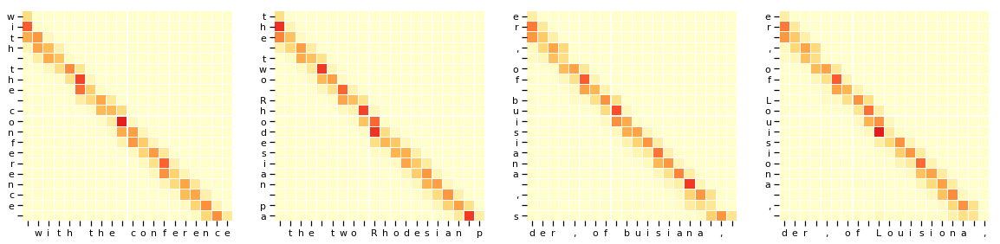

Decoder Self-Attention Layer 2


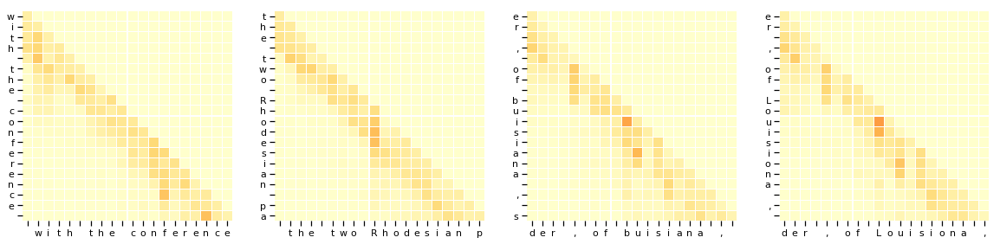

Decoder Self-Attention Layer 3


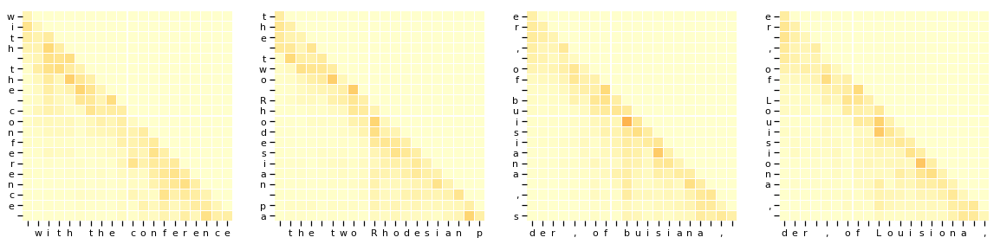

Decoder Self-Attention Layer 4


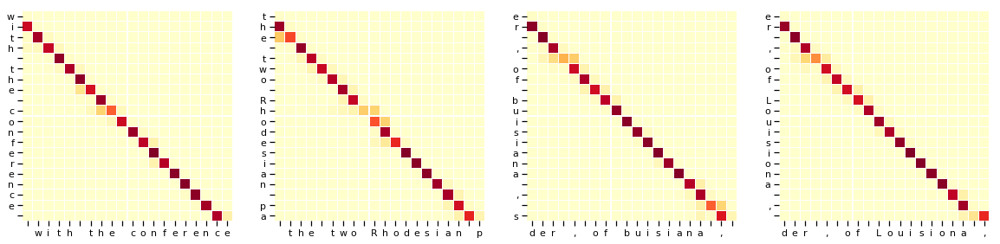

In [68]:
sns.set_context(context="notebook")

def draw(data, x, y, ax):
    return sns.heatmap(data, xticklabels=x, square=True, yticklabels=y, vmin=0.0, vmax=1.0,
                       cmap='YlOrRd', linewidths=0.05, cbar=False, ax=ax)

for layer in range(4):
    print("Decoder Self-Attention Layer", layer+1)

    fig, axes = plt.subplots(1,4, figsize=(20, 10))
    for i,ax in enumerate(axes.flat):
        # greedy decoding (no access to true values)
        pred = char_split_text(g_res[i])[20:40]
        shifted_y = rshift(g_res.float()).long()
        true = char_split_text(shifted_y[i])[20:40]
        g = draw(self_attn(layer)[i].data[20:40, 20:40], true, pred, ax=ax)
        g.set_yticklabels(g.get_yticklabels(), rotation=0) 
        g.set_xticklabels(g.get_xticklabels(), rotation=0) 
    plt.show()

## Decoder Source-Attention

In [ ]:
fig, axes = plt.subplots(1,4, gridspec_kw={'hspace': 0.5}, figsize=(20, 10))
    
for idx in range(len(axes.flat)//4):
    img = imgs[idx]
    g_chars = g_res[idx]
    
    # 4 attn layers
    for h in range(4):
        attn = source_attn(h)
        g_attns = to_np(torch_scale_attns(attn)[idx])

        show_attn(img, g_attns, g_chars, axes[idx,h], 'YlGn', showChars=False)
        axes[idx,h].set_title(f'layer {h+1}')

## Validation vs Greedy (final layer src-attn)

In [53]:
v_scaled_attns = torch_scale_attns(thresh_attn(v_attn))
g_scaled_attns = torch_scale_attns(thresh_attn(g_attn))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


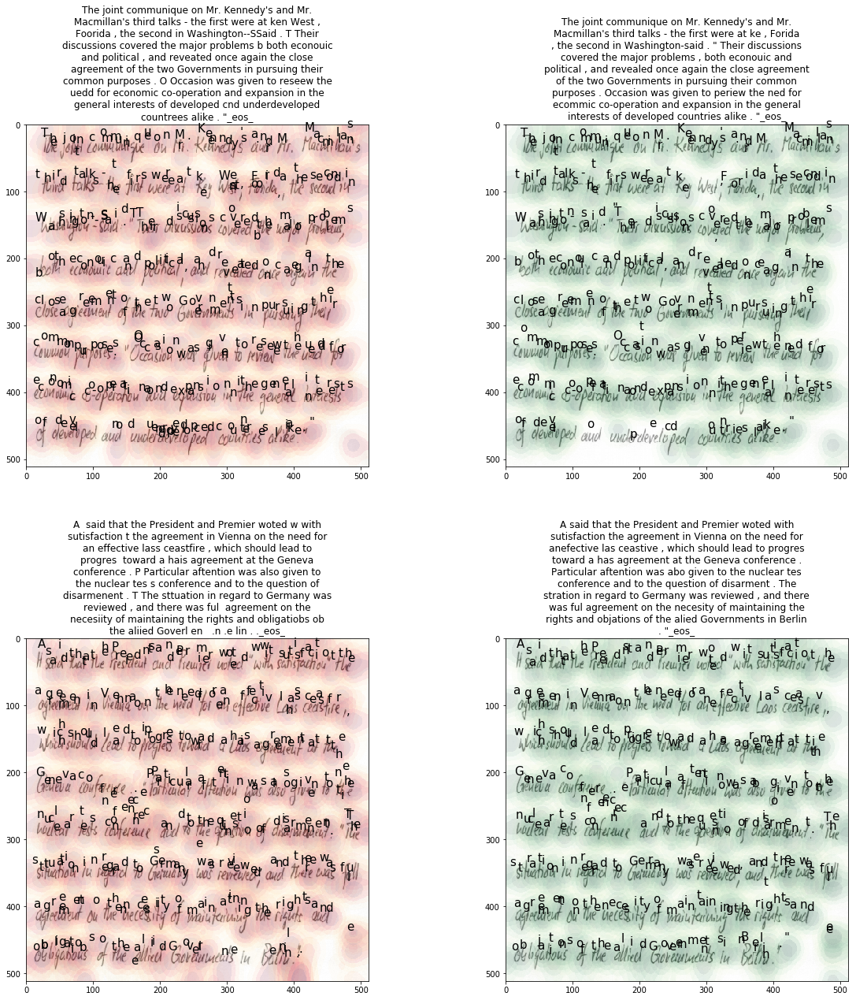

In [54]:
fig, axes = plt.subplots(2,2, gridspec_kw={'hspace': 0.5}, figsize=(20, 20))
for idx in range(len(axes.flat)//2):
    img = imgs[idx]

    v_chars = v_res[idx]
    v_attns = to_np(v_scaled_attns[idx])

    g_chars = g_res[idx]
    g_attns = to_np(g_scaled_attns[idx])
    
    # valid
    show_attn(img, v_attns, v_chars, axes[idx,0], 'YlOrRd')
    # greedy
    show_attn(img, g_attns, g_chars, axes[idx,1], 'YlGn')

# Individual Examination

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


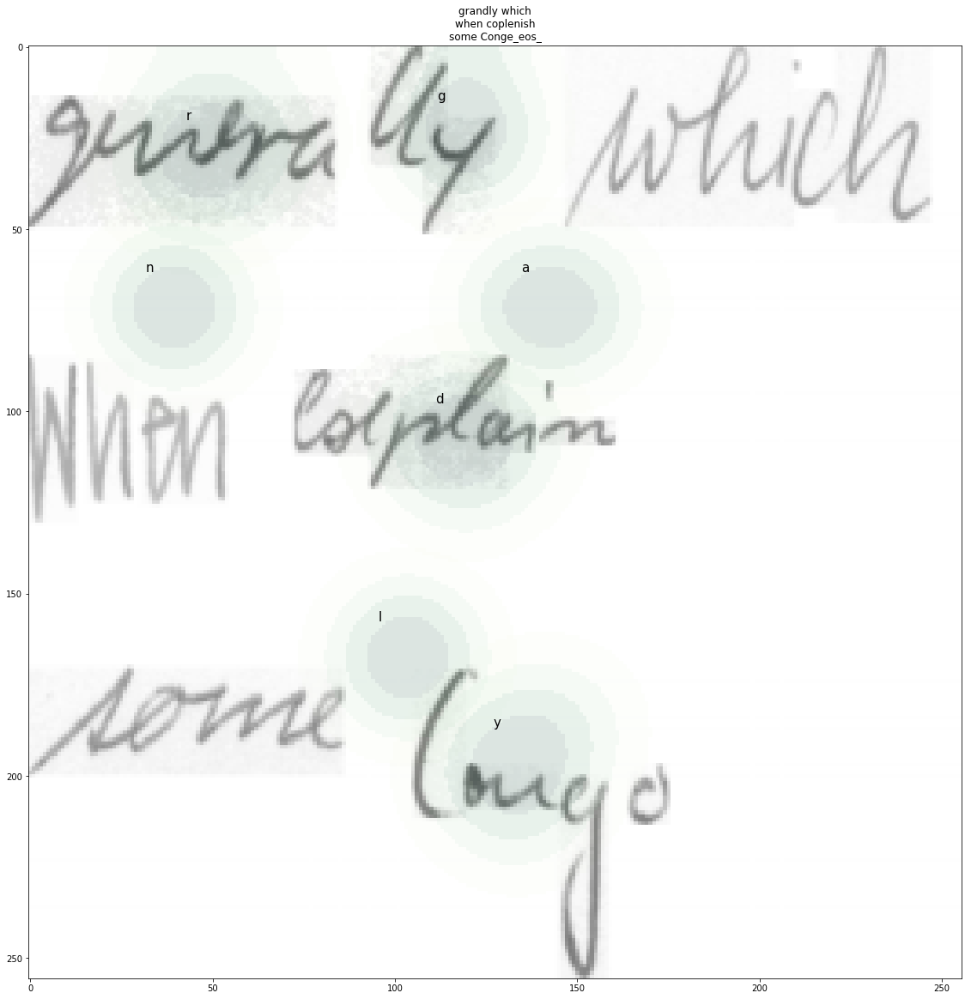

In [145]:
idx=0
img = imgs[idx]

g_words = g_w_res[idx]
g_scaled_attns = torch_scale_attns(thresh_attn(g_w_attn)[0:1])  # passing in bs of 1
g_attns = to_np(g_scaled_attns[0])  # removing bs

fig, ax = plt.subplots(1,1, figsize=(20, 20))
show_attn(img, g_attns, g_chars, ax, 'YlGn')

Decoder Self-Attention Layer 1


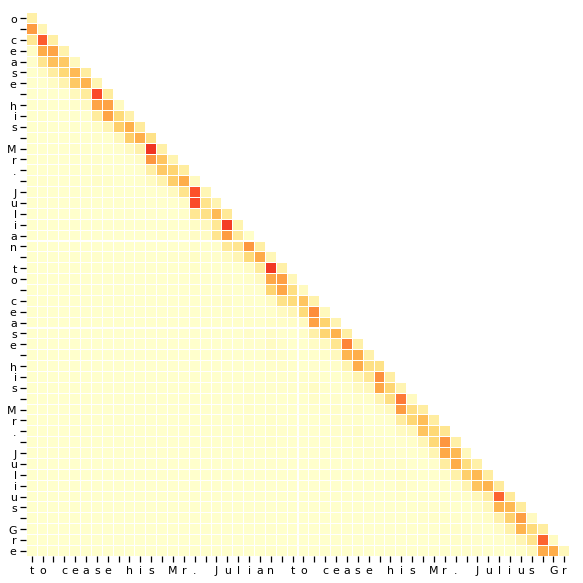

Decoder Self-Attention Layer 2


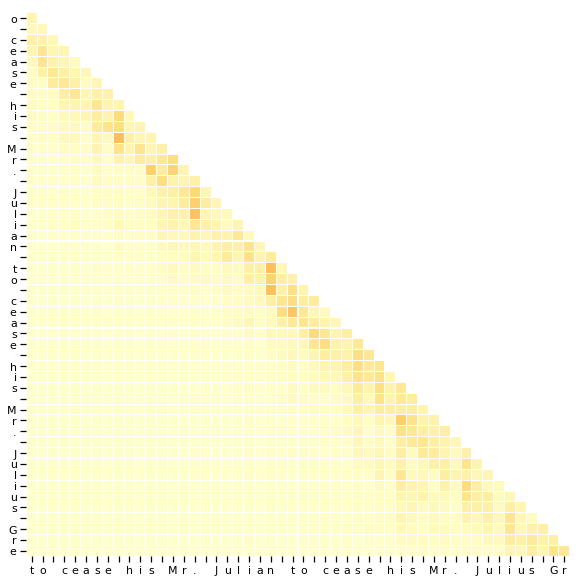

Decoder Self-Attention Layer 3


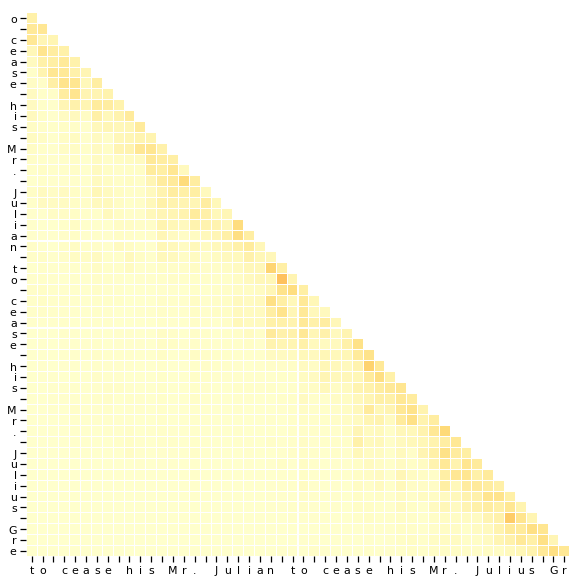

Decoder Self-Attention Layer 4


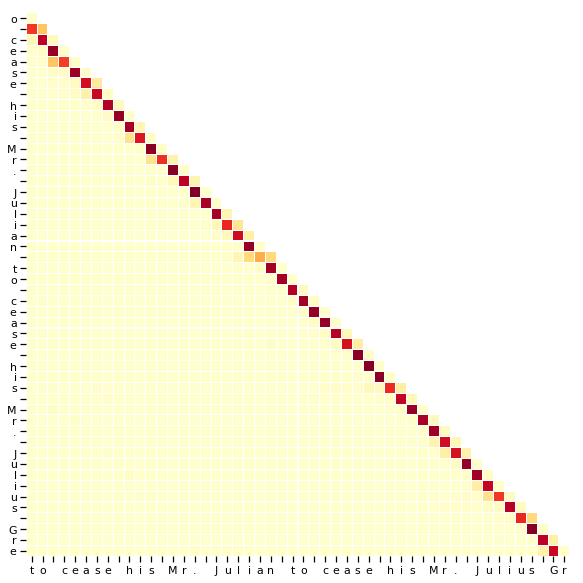

In [82]:
sns.set_context(context="notebook")

def draw(data, x, y, ax):
    mask = np.zeros_like(data)
    mask[np.triu_indices_from(mask, k=1)] = True
    return sns.heatmap(data, xticklabels=x, square=True, yticklabels=y, vmin=0.0, vmax=1.0,
                       mask=mask, cmap='YlOrRd', linewidths=0.05, cbar=False, ax=ax)

for layer in range(4):
    print("Decoder Self-Attention Layer", layer+1)

    fig, ax = plt.subplots(1,1, figsize=(20, 10))
    i = 1
    # greedy decoding (no access to true values)
    pred = char_split_text(g_res[i])[230:280]
    shifted_y = rshift(g_res.float()).long()
    true = char_split_text(shifted_y[i])[230:280]
    g = draw(self_attn(layer)[i].data[230:280, 230:280], true, pred, ax=ax)
    g.set_yticklabels(g.get_yticklabels(), rotation=0) 
    g.set_xticklabels(g.get_xticklabels(), rotation=0) 
    plt.show()

# Memory utility methods

In [ ]:
# prints currently alive Variables     # Tensors and 
import gc
for obj in gc.get_objects():
    try:
        if (hasattr(obj, 'data') and torch.is_tensor(obj.data)):     # torch.is_tensor(obj) or 
            print(obj.name, type(obj), obj.size())
    except:
        pass

In [58]:
def tensor_size(tensor):
    return (tensor.element_size() * tensor.v_res.nelement())

tensor_size(v_res)

8